In [1]:
import pandas as pd
import numpy as np
from numpy import percentile
from scipy import stats


from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

import random

from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel

from numpy import mean, std
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedStratifiedKFold

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.stats.api as sms
import statsmodels.stats as sm_stats

import textwrap

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
plot_pairplots = True
other_plots = True
lasso = True

# Loading

In [4]:
path_to_events = '../UXTweak/Ostre-2/Exporty z UXtweak/Prepared_Dataset/'
df = pd.read_json(path_to_events + "dataset_1_pageview_per_row.json", orient ='records')

In [5]:
df.rename(columns={"time": "movement_time_span"}, inplace=True)

In [6]:
df[:5]

,Session,indicator_fg,Page,Likert_value,Big5,movement_time_span,duration,distance,x_axis_distance,y_axis_distance,real_ideal_trajectory_diff,max_deviation,speed,x_axis_speed,y_axis_speed,acc,x_axis_acc,y_axis_acc,auc,clicks,x_flips,y_flips,visits,scrolling,init_time,react_time
0,gsd4FIhsnwaOIMOtoSqX4geVy,1,3,4,1,14236,14893,4099.440429,3635.15625,1076.0,3434.874661,539.568132,0.287963,0.255350,0.075583,0.000020,0.000018,0.000005,50776.687500,2,8,8,1,False,261,7861
1,gsd4FIhsnwaOIMOtoSqX4geVy,1,4,5,1,2448,4529,1298.103346,1235.43750,354.0,456.372879,123.642760,0.530271,0.504672,0.144608,0.000217,0.000206,0.000059,161737.125000,2,2,1,1,False,470,2520
2,gsd4FIhsnwaOIMOtoSqX4geVy,1,5,5,1,4051,4355,976.613565,885.84375,329.0,241.107925,18.563896,0.241080,0.218673,0.081215,0.000060,0.000054,0.000020,74979.609375,2,2,4,1,False,281,3316
3,gsd4FIhsnwaOIMOtoSqX4geVy,1,6,3,1,1432,6039,478.125316,256.78125,300.0,65.496732,81.348974,0.333886,0.179317,0.209497,0.000233,0.000125,0.000146,18163.406250,2,2,3,1,False,2264,3262
4,gsd4FIhsnwaOIMOtoSqX4geVy,1,7,4,1,3648,4513,645.698909,551.71875,306.0,177.745514,71.096966,0.177001,0.151239,0.083882,0.000049,0.000041,0.000023,91599.750000,2,2,7,1,False,417,3670


In [7]:
len(df)

6944

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6944 entries, 0 to 6943
Data columns (total 26 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Session                     6944 non-null   object 
 1   indicator_fg                6944 non-null   int64  
 2   Page                        6944 non-null   int64  
 3   Likert_value                6944 non-null   object 
 4   Big5                        6944 non-null   int64  
 5   movement_time_span          6944 non-null   int64  
 6   duration                    6944 non-null   int64  
 7   distance                    6944 non-null   float64
 8   x_axis_distance             6944 non-null   float64
 9   y_axis_distance             6944 non-null   float64
 10  real_ideal_trajectory_diff  6898 non-null   float64
 11  max_deviation               6898 non-null   float64
 12  speed                       6944 non-null   float64
 13  x_axis_speed                6944 

In [9]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

df = df[df['Big5'] == 1]

columns_metrics = ['Likert_value', 'movement_time_span', 'duration', 'distance',
       'x_axis_distance', 'y_axis_distance', 'real_ideal_trajectory_diff',
       'max_deviation', 'speed', 'x_axis_speed', 'y_axis_speed', 'acc',
       'x_axis_acc', 'y_axis_acc', 'auc', 'clicks', 'x_flips', 'y_flips',
       'visits', 'init_time', 'react_time']

df['Likert_value'] = df['Likert_value'].astype('int')
print(len(df))

# scaler = MinMaxScaler()
# scaler = StandardScaler()

# df[columns_metrics] = scaler.fit_transform(df[columns_metrics])
# df[:5]

5376


In [10]:
df_multiple_visits = df[df['visits'] != 1][['Session', 'Page', 'visits']]
df_multiple_visits

,Session,Page,visits
69,IKW3ZZ9lcX5Z3vSKEghI73tuI,10,2
287,RBPuYafOHOIdMXLQ07pBerkXl,42,2
288,RBPuYafOHOIdMXLQ07pBerkXl,43,2
310,DrTk41pNckxJYIdilpta9qJBT,3,2
625,jcvlt3renH3FwZuO0vUqmgbKt,8,2
...,...,...,...
6912,DPESrzxKVWTAlVhksRGpPRAKy,33,2
6913,DPESrzxKVWTAlVhksRGpPRAKy,34,2
6916,DPESrzxKVWTAlVhksRGpPRAKy,37,2
6917,DPESrzxKVWTAlVhksRGpPRAKy,38,2


In [11]:
len(df_multiple_visits.groupby('Session')['Session'].count())

44

# Pair plot of means

In [12]:
mean_df = df.groupby('Session').mean().drop(['Page', 'Big5', 'scrolling'], axis=1)
mean_df['indicator_fg'] = mean_df['indicator_fg'].replace({0: 'Honest', 1: 'Faking good'})
rename_indicator_fg = 'Experiment variant'
# rename_likert_value = 'Likert scale value calculated by adapted methodology (more socially desirable answer has a higher value)'
rename_likert_value = 'Social desirability mapping of Likert scale answers (by scoring key)'
wrap_rename_likert_value = lambda x: '\n'.join(textwrap.wrap(rename_likert_value, width=x))
mean_df = mean_df.rename(columns={'indicator_fg': rename_indicator_fg, 'Likert_value': rename_likert_value})
mean_df

,Experiment variant,Social desirability mapping of Likert scale answers (by scoring key),movement_time_span,duration,distance,x_axis_distance,y_axis_distance,real_ideal_trajectory_diff,max_deviation,speed,x_axis_speed,y_axis_speed,acc,x_axis_acc,y_axis_acc,auc,clicks,x_flips,y_flips,visits,init_time,react_time
Session,,,,,,,,,,,,,,,,,,,,,,
05b1eCn35mhtHiwd3sQNGd0am,Honest,2.895833,3717.916667,5241.750000,837.047701,626.548828,407.541667,382.023991,125.501087,0.299354,0.224500,0.148377,0.000153,0.000114,0.000078,69463.227539,1.145833,3.166667,2.833333,1.104167,1492.916667,4535.270833
0GNYlUU5mGtxOPKr275ut1hI7,Faking good,4.166667,1926.645833,3850.791667,917.624154,781.880859,349.645833,335.424331,109.995792,0.521042,0.441638,0.210452,0.000359,0.000302,0.000151,123173.305664,1.958333,2.520833,2.020833,1.000000,1486.229167,2804.854167
34OsjvpQRQYY2xLKiMczMVFRE,Faking good,3.208333,3951.750000,5432.395833,1103.137757,892.203125,465.187500,600.748318,164.510358,0.311779,0.250420,0.137004,0.000115,0.000091,0.000054,84170.968750,2.645833,4.187500,4.312500,1.000000,1119.312500,4314.083333
4yztrGSPl7y05M3njyJNRr6mk,Honest,4.000000,5691.666667,6388.333333,1619.614416,1277.890625,717.854167,1025.151100,249.006231,0.305290,0.243252,0.132964,0.000065,0.000052,0.000028,108989.450195,2.312500,5.104167,4.541667,1.041667,388.770833,5270.312500
5HPhIkC2ryz2x5IiTSDGramvs,Honest,3.312500,3057.791667,4484.104167,830.180036,650.632812,394.437500,389.134240,91.875321,0.358550,0.286625,0.170179,0.000242,0.000196,0.000116,78413.199219,1.208333,4.104167,5.166667,1.000000,1356.229167,3662.125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
xGZiyHsLw13YSV8NwVLnevNK8,Honest,3.479167,5278.125000,7431.208333,748.961681,532.382812,394.229167,292.380238,106.176400,0.203832,0.144540,0.109991,0.000079,0.000055,0.000045,73955.030273,2.062500,3.395833,3.208333,1.062500,1855.270833,6209.625000
yQOKd4r41wCPrKd5cVFaAuJED,Honest,3.250000,2600.479167,4766.333333,1482.057091,1320.080566,447.005208,630.656871,98.210129,0.620496,0.556568,0.185990,0.000304,0.000275,0.000089,151561.254883,2.083333,3.083333,2.729167,1.000000,1982.354167,3476.458333
ynePoKNeqa1CHW0m54pd86SY1,Faking good,3.645833,5796.604167,6436.541667,689.290393,495.279297,360.937500,242.462681,66.930651,0.130292,0.094123,0.068373,0.000028,0.000021,0.000015,76821.991211,2.187500,4.083333,3.645833,1.000000,476.333333,5373.812500


In [13]:
export_dataframe = mean_df.reset_index()
export_dataframe['Session'].to_excel('Selected_session.xlsx', sheet_name='Session', index=False)

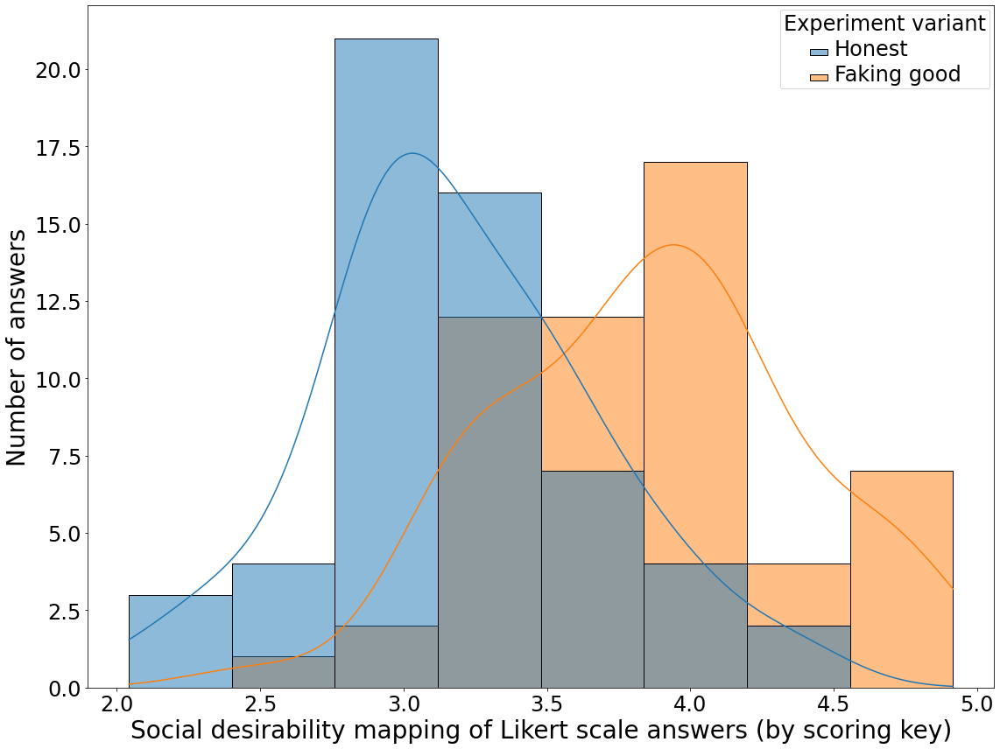

In [14]:
fig, ax = plt.subplots(figsize=(16, 12))
mean_likert_hist = sns.histplot(mean_df, x=rename_likert_value, hue=rename_indicator_fg, kde=True, ax=ax)
# ax.set_ylabel('Count', rotation=0, ha='center', va='center', labelpad=50, fontsize=28)
ax.set_ylabel('Number of answers', fontsize=28)
ax.set_xlabel(wrap_rename_likert_value(100), fontsize=28)
ax.tick_params(axis='both', which='major', labelsize=24)
plt.setp(ax.get_legend().get_texts(), fontsize='24') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='24') # for legend title
plt.tight_layout()

In [15]:
fig.savefig('mean_likert_hist.png', format='png', dpi=300)

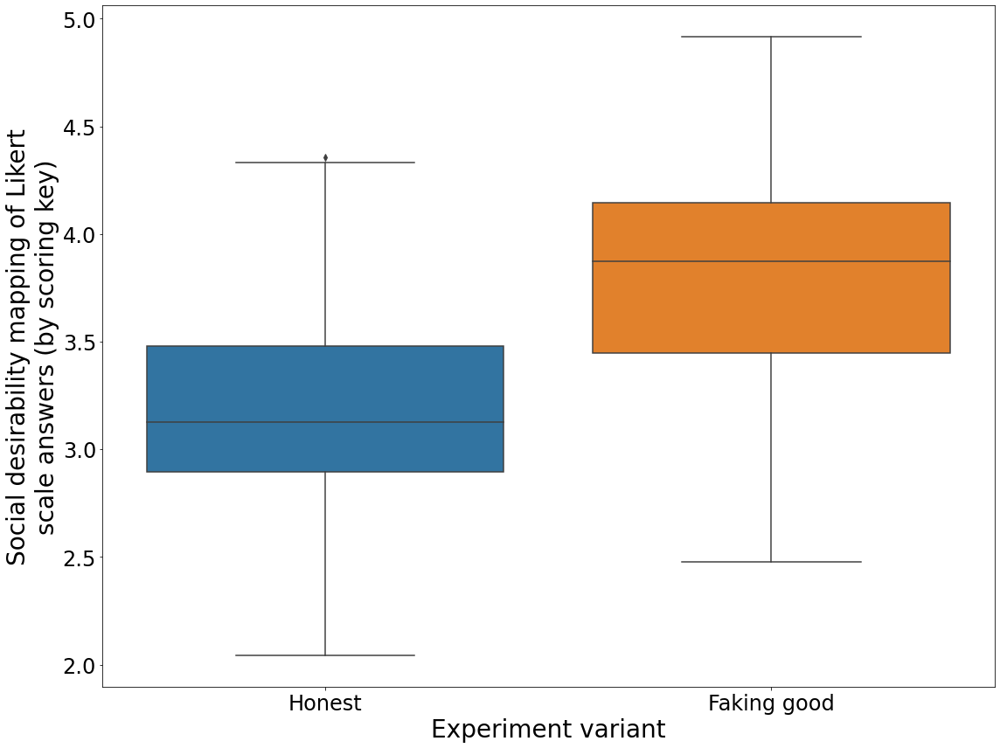

In [16]:
fig, ax = plt.subplots(figsize=(16, 12))
sns.boxplot(x=rename_indicator_fg, y=rename_likert_value, data=mean_df, ax=ax)
# ax.set_ylabel(wrap_rename_likert_value(20), rotation=0, ha='center', va='center', labelpad=160, fontsize=28)
ax.set_ylabel(wrap_rename_likert_value(40), fontsize=28)
ax.set_xlabel('Experiment variant', fontsize=28)
ax.tick_params(axis='both', which='major', labelsize=24)
plt.tight_layout()

In [17]:
fig.savefig('mean_likert_boxplot.png', format='png', dpi=300)

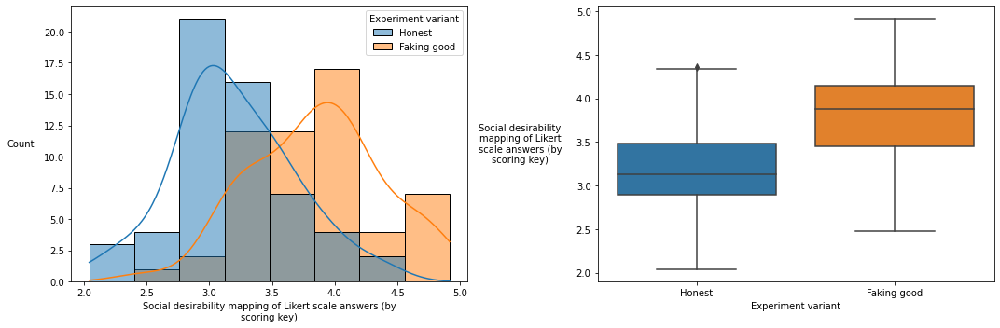

In [18]:
fig, axs = plt.subplots(ncols=2, figsize=(15, 5))

# First subplot
mean_likert_hist = sns.histplot(mean_df, x=rename_likert_value, hue=rename_indicator_fg, kde=True, ax=axs[0])
axs[0].set_ylabel('Count', rotation=0, ha='center', va='center', labelpad=25)
axs[0].set_xlabel(wrap_rename_likert_value(60))

# Second subplot
sns.boxplot(x=rename_indicator_fg, y=rename_likert_value, data=mean_df, ax=axs[1])
axs[1].set_ylabel(wrap_rename_likert_value(20), rotation=0, ha='center', va='center', labelpad=60)

plt.tight_layout()
plt.show()

In [19]:
fig.savefig('mean_likert_hist_and_boxplot.svg', format='svg')

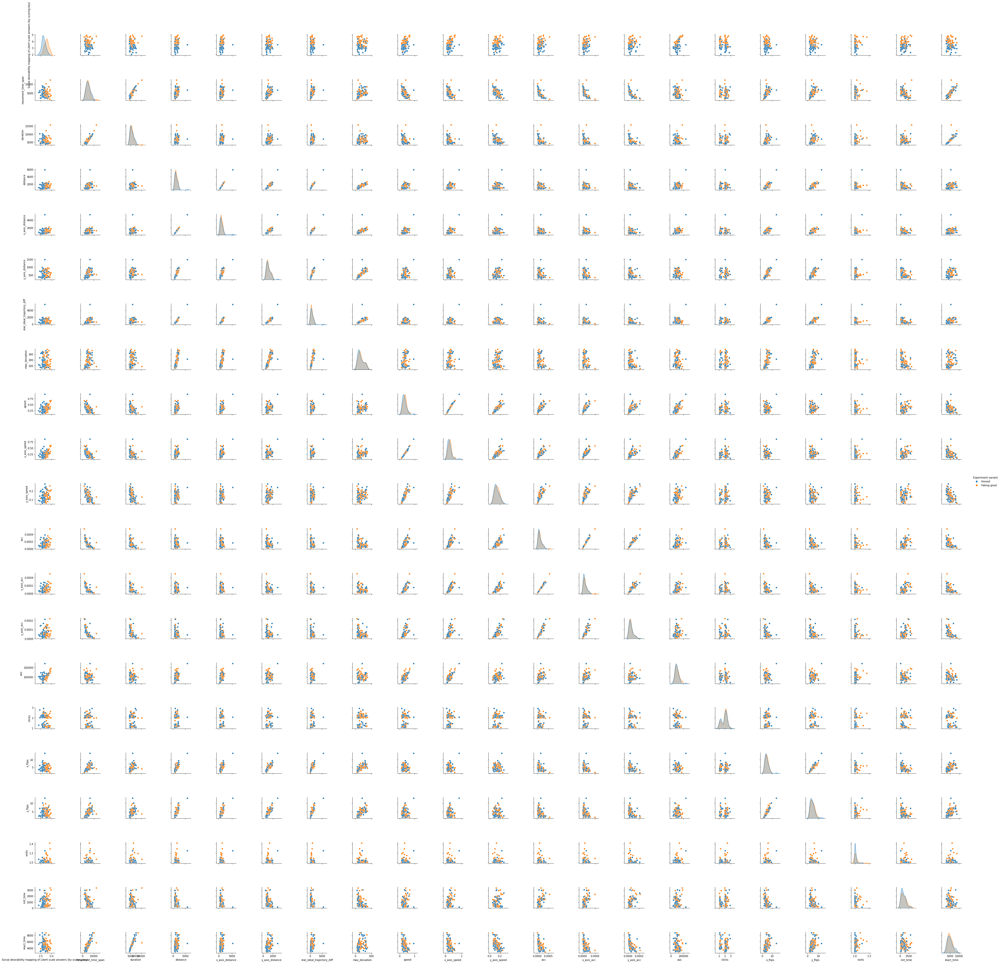

In [20]:
if plot_pairplots:
    mean_pairplot = sns.pairplot(mean_df, hue=rename_indicator_fg, dropna=True)

In [21]:
if plot_pairplots:
    mean_pairplot.fig.savefig('mean_pairplot.svg', format='svg')

# Tests

In [22]:
def cohen_d(x1, x2):
    nx1 = len(x1)
    nx2 = len(x2)
    s = np.sqrt(((nx1-1) * np.std(x1, ddof=1)**2 + (nx2-1) * np.std(x2, ddof=1)**2) / (nx1 + nx2 - 2))
    return (np.abs(np.mean(x1) - np.mean(x2))) / s

In [23]:
def test_feature(df, feature_name, results, ignore_power=False):
    feature_i = df.loc[(df['indicator_fg'] == 1) & (df[feature_name].notnull()), feature_name]  

    feature_ni = df.loc[(df['indicator_fg'] == 0) & (df[feature_name].notnull()), feature_name]
    
    # print(len(feature_i) + len(feature_ni))
    
    alpha = 0.05
    t_test = True
    selected = True
    
    t_u_p = [feature_name, -1, -1, -1, -1, -1, -1, -1]
    
    print("----------Shapiro test----------")
    shapiro_test_i = stats.shapiro(feature_i)
    shapiro_test_ni = stats.shapiro(feature_ni)
    
    if shapiro_test_i.pvalue < alpha and shapiro_test_ni.pvalue < alpha:
        print("The null hypothesis that the data was drawn from a normal distribution can be rejected")
        t_test = False
    else:
        print("The null hypothesis that the data was drawn from a normal distribution cannot be rejected")
    
    print("----------Levene test----------")
    levene_test = stats.levene(feature_i, feature_ni)
    
    if levene_test.pvalue < alpha:
        print("The null hypothesis that all input samples are from populations with equal variances can be rejected")
        t_test = False
    else:
        print("The null hypothesis that all input samples are from populations with equal variances cannot be rejected")
    
    if t_test:
        print("----------T test----------")
        t_test = stats.ttest_ind(feature_i, feature_ni)
        print(t_test)
        t_u_p[1] = t_test.statistic
        t_u_p[2] = t_test.pvalue
        if t_test.pvalue < alpha:
            print("The null hypothesis that 2 independent samples have identical average (expected) values can be rejected")
        else:
            print("The null hypothesis that 2 independent samples have identical average (expected) values cannot be rejected")
            selected = False
    else:
        print("----------U test----------")
        u_test = stats.mannwhitneyu(feature_i, feature_ni)
        print(u_test)
        t_u_p[3] = u_test.statistic
        t_u_p[4] = u_test.pvalue
        
        # Calculate the z-value
        U1, p = u_test
        nx, ny = len(feature_i), len(feature_ni)
        U2 = nx*ny - U1
        
        U = min(U1, U2)
        N = nx + ny
        z = (U - nx*ny/2 + 0.5) / np.sqrt(nx*ny * (N + 1)/ 12)
        p = 2 * stats.norm.cdf(z)  # use CDF to get p-value from smaller statistic
        
        print("U statistic:", U)
        print("P-value:", p)
        print("Z-value:", z)
        t_u_p[7] = z

        if u_test.pvalue < alpha:
            print("The null hypothesis that the distribution underlying sample x is the same as the distribution underlying sample y can be rejected")
        else:
            print("The null hypothesis that the distribution underlying sample x is the same as the distribution underlying sample y cannot be rejected")
            selected = False

    print("----------Power----------")
    feature_c_d = cohen_d(feature_i, feature_ni)
    power_feature = sm_stats.power.tt_ind_solve_power(feature_c_d, len(feature_i), 0.05, None, 1)
    t_u_p[5] = power_feature
    if power_feature > 0.7:
        print("Sufficient power", power_feature)
    else:
        print("Not sufficient power", power_feature)
        if not ignore_power:
            selected = False

    print(feature_name, selected)
    t_u_p[6] = selected
    results.append(t_u_p)
    return selected


In [24]:
feature_names = list(df.columns)
feature_names.remove('Session')
feature_names.remove('indicator_fg')
feature_names.remove('Page')
feature_names.remove('Big5')
feature_names.remove('scrolling')

selected_features = []
results = []

for feature_name in feature_names:
    print('\n++++++++++Test for {}++++++++++'.format(feature_name))
    if test_feature(df, feature_name, results, ignore_power=False):
        selected_features.append(feature_name)
    
print(selected_features)


++++++++++Test for Likert_value++++++++++
----------Shapiro test----------
The null hypothesis that the data was drawn from a normal distribution can be rejected
----------Levene test----------
The null hypothesis that all input samples are from populations with equal variances can be rejected
----------U test----------
MannwhitneyuResult(statistic=4788169.5, pvalue=3.392331334030236e-102)
U statistic: 2434870.5
P-value: 4.957207170793767e-95
Z-value: -20.682713918754114
The null hypothesis that the distribution underlying sample x is the same as the distribution underlying sample y can be rejected
----------Power----------
Sufficient power 1.0
Likert_value True

++++++++++Test for movement_time_span++++++++++
----------Shapiro test----------
The null hypothesis that the data was drawn from a normal distribution can be rejected
----------Levene test----------
The null hypothesis that all input samples are from populations with equal variances cannot be rejected
----------U test-------

In [25]:
test_results = pd.DataFrame(results, columns = ['Feature', 'T-test statistic', 'T-test p-value', 'U-test statistic', 'U-test p-value', 'Power', 'Selected', 'U-test z-value'])
relevant_test_results = test_results[['Feature', 'U-test statistic', 'U-test p-value', 'Power', 'Selected', 'U-test z-value']]
relevant_test_results.index = np.arange(1, len(relevant_test_results) + 1)
relevant_test_results

,Feature,U-test statistic,U-test p-value,Power,Selected,U-test z-value
1,Likert_value,4788169.5,3.392331e-102,1.000000,True,-20.682714
2,movement_time_span,3528889.0,1.463767e-01,0.051781,False,-1.452449
3,duration,3687384.0,1.823673e-01,0.137750,False,-1.333501
4,distance,4060322.5,3.049093e-15,0.286953,False,-7.888881
5,x_axis_distance,4158777.0,6.616428e-22,0.466512,False,-9.619478
6,y_axis_distance,3798256.0,1.029356e-03,0.086723,False,-3.282370
7,real_ideal_trajectory_diff,3725761.0,5.296391e-03,0.084773,False,-2.788432
8,max_deviation,3752610.0,1.096086e-03,0.975441,True,-3.264626
9,speed,4110278.5,1.835074e-18,0.991063,True,-8.766989
10,x_axis_speed,4193354.0,1.496941e-24,0.999157,True,-10.227260


In [26]:
relevant_test_results.to_excel(r'C:\Users\PeterSmrecek\Documents\Exports\U-test_results.xlsx', sheet_name='U-test results', index=True)

# Random state

In [27]:
# Seed must be between 0 and 2**32 - 1

random_state = 569229619

print(random_state)
random.seed(random_state)

569229619


# Divide: Test & Train

In [28]:
df_to_train = df.copy(deep=True)

## Select

In [29]:
def select_sessions(lst, n = 18):
    i = 0
    selected = []
    while i < n:
        element = random.choice(lst)
        if element not in selected:
            selected.append(element)
            i += 1
    return selected

In [30]:
# random test selection

fg_list_sessions = list(set(list(df[df['indicator_fg'] == 1]['Session'])))
fg_list_sessions.sort()
h_list_sessions = list(set(list(df[df['indicator_fg'] == 0]['Session'])))
h_list_sessions.sort()

fg_selected = select_sessions(fg_list_sessions)
h_selected = select_sessions(h_list_sessions)

print(fg_selected)
print(h_selected)
all_selected = fg_selected + h_selected

['rBwaeMLAX9nPiQy9BieuiFiAO', 'WX6bamzNklg6PlFfKupotk2FW', '34OsjvpQRQYY2xLKiMczMVFRE', 'VajALjCapZgxxkAzTWNDVWXOB', '903G6972fkr5z0n04P3NfFjIS', '93npiDWQK6VipNjEWLfWafqsr', 'QJpzM76mOzzx41jlZ2cD68ZVr', 'oHWOYzMTNwQN7gGNuwwrc2q58', 'aGWX89ZStczYODlw7byX9cSce', 'ynePoKNeqa1CHW0m54pd86SY1', 'bFWJvlSjZLbgznUva0d86yGwS', 'KOq8m7kgSimUpV4gORbAX574C', 'TZcocph2t67jhKfcZSdo0BBaU', 'MU3B7xrha3Nr3DmLVeeCy7vGG', 'J84AyKOw3eXAhQAE9iZYAYCxB', 'kDtZ55pukriLSh8VOnV6D5h3N', 'niEXFrlkmqE1vexhOLRNtF7uY', 'GIszPEY36M0Y6Zaq2mJQYE2Ev']
['lFkmX9UFPQu87VmX3QOtjZ3zK', 'UAytqC2udrP0JcwjdcjhhCNw8', 'KDWak467FmFZN321qc8Qumwhc', 'z5R93zFJCrmP8NAk3yypRkpiz', '8aOLee8TtAaJYBkJgJrQbqw6g', 'D5fYqE7ofhnJGZih8TLcEhdyD', 'n0OYGf6ieNDHT94qgjog5peBJ', 'B9f22juxHTJ70W0mINyPifnCJ', 'OK0LALqyDvRa2oBp6nnkjdks9', '99TUULTfZzD3H9F0bzzHus3c4', '05b1eCn35mhtHiwd3sQNGd0am', 'tseRJkAbZhFUXHnhjPWHBhHmF', 'L6IhgGIgpITGDZBBihX1d92Uv', 'pjbcxDZTIqBgwJId1zjBVZQbS', 'kWXMrfT5jl0TFxhgstlFq9PkE', 'uwMvzBSDsgBHsj50M3MLQmOaw', 'RBPuYafOHOI

In [31]:
df_to_test = df_to_train[df_to_train['Session'].isin(all_selected)]
df_to_train = df_to_train[~df_to_train['Session'].isin(all_selected)]
print(len(df_to_test), len(df_to_train), len(df), len(df_to_test)+len(df_to_train))

1728 3648 5376 5376


In [32]:
df_to_train = df_to_train[df_to_train['Big5'] == 1]
df_to_train = df_to_train.drop(["Session", "scrolling", "Big5"], axis=1)
df_to_train = df_to_train.dropna()

df_to_test = df_to_test[df_to_test['Big5'] == 1]
df_to_test = df_to_test.dropna()

## Plots

In [33]:
def show_boxplots(x, columns, df, showfliers=True):
    fig, axs = plt.subplots(ncols=3, nrows=7, figsize=(20, 30))
    for idx, col in enumerate(columns):
        ax = sns.boxplot(x=x, y=col, data=df, showfliers=showfliers, ax=axs[idx//3][idx%3])
    plt.show()

In [34]:
def show_histograms(columns, df, hue=None, kde=False):
    fig, axs = plt.subplots(ncols=3, nrows=7, figsize=(20, 30))
    for idx, col in enumerate(columns):
        try:
            ax = sns.histplot(x=col, data=df, hue=hue, kde=kde, ax=axs[idx//3][idx%3])
        except:
            print("Error - col {}".format(col))
    plt.show()

In [35]:
def show_box_boxwithout_hist(x, columns, df, kde=False):
    fig, axs = plt.subplots(ncols=3, nrows=len(columns), figsize=(20, 30))
    for idx, col in enumerate(columns):
        ax = sns.boxplot(x=x, y=col, data=df, showfliers=True, ax=axs[idx][0])
        ax = sns.boxplot(x=x, y=col, data=df, showfliers=False, ax=axs[idx][1])
        try:
            ax = sns.histplot(x=col, data=df, hue=x, kde=kde, ax=axs[idx][2])
        except:
            print("Error - col {}".format(col))
    plt.show()

In [36]:
def identify_outliers(merged):
    suma = 0
    for col in merged.columns:
        q25, q75 = percentile(merged[col], 25), percentile(merged[col], 75)
        iqr = q75 - q25
        cut_off = iqr * 1.5
        lower, upper = q25 - cut_off, q75 + cut_off
        outliers = merged[((merged[col] < lower) | (merged[col] > upper))] 
        print(col, 'Identified outliers: %d' % len(outliers))
        suma += len(outliers)
    print('Sum of identified outliers: %d' % suma)

In [37]:
def remove_outliers(merged):
    newMerged = merged.copy()
    for col in newMerged.columns:
        q25, q75 = percentile(newMerged[col], 25), percentile(newMerged[col], 75)
        iqr = q75 - q25
        cut_off = iqr * 1.5
        lower, upper = q25 - cut_off, q75 + cut_off
        newMerged = newMerged[((newMerged[col] >= lower) & (newMerged[col] <= upper))] 
    return newMerged

In [38]:
df_plots = pd.concat([df_to_train, df_to_test], axis=0)
df_plots = df_plots.drop(["Session", "scrolling", "Big5"], axis=1)

In [39]:
df_plots

,indicator_fg,Page,Likert_value,movement_time_span,duration,distance,x_axis_distance,y_axis_distance,real_ideal_trajectory_diff,max_deviation,speed,x_axis_speed,y_axis_speed,acc,x_axis_acc,y_axis_acc,auc,clicks,x_flips,y_flips,visits,init_time,react_time
0,1,3,4,14236,14893,4099.440429,3635.156250,1076.00,3434.874661,539.568132,0.287963,0.255350,0.075583,0.000020,0.000018,0.000005,50776.687500,2,8,8,1,261,7861
1,1,4,5,2448,4529,1298.103346,1235.437500,354.00,456.372879,123.642760,0.530271,0.504672,0.144608,0.000217,0.000206,0.000059,161737.125000,2,2,1,1,470,2520
2,1,5,5,4051,4355,976.613565,885.843750,329.00,241.107925,18.563896,0.241080,0.218673,0.081215,0.000060,0.000054,0.000020,74979.609375,2,2,4,1,281,3316
3,1,6,3,1432,6039,478.125316,256.781250,300.00,65.496732,81.348974,0.333886,0.179317,0.209497,0.000233,0.000125,0.000146,18163.406250,2,2,3,1,2264,3262
4,1,7,4,3648,4513,645.698909,551.718750,306.00,177.745514,71.096966,0.177001,0.151239,0.083882,0.000049,0.000041,0.000023,91599.750000,2,2,7,1,417,3670
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6863,1,46,1,2262,4386,929.093115,826.289062,355.00,29.766687,30.201721,0.410740,0.365291,0.156941,0.000182,0.000161,0.000069,176649.096680,2,1,1,1,1885,3404
6864,1,47,5,2042,4532,940.357442,841.757812,348.75,29.211662,45.665139,0.460508,0.412222,0.170788,0.000226,0.000202,0.000084,171135.937500,2,1,2,1,2075,3439
6865,1,48,5,5148,5773,2322.109453,2041.875000,822.50,1263.764211,238.192068,0.451070,0.396635,0.159771,0.000088,0.000077,0.000031,235752.612305,3,10,8,1,214,4865
6866,1,49,5,1478,4366,1035.445104,942.304688,362.50,25.810805,22.134784,0.700572,0.637554,0.245264,0.000474,0.000431,0.000166,200697.363281,2,1,2,1,2286,3111


In [40]:
len(df_plots)

5344

In [41]:
df_plots.columns

Index(['indicator_fg', 'Page', 'Likert_value', 'movement_time_span',
       'duration', 'distance', 'x_axis_distance', 'y_axis_distance',
       'real_ideal_trajectory_diff', 'max_deviation', 'speed', 'x_axis_speed',
       'y_axis_speed', 'acc', 'x_axis_acc', 'y_axis_acc', 'auc', 'clicks',
       'x_flips', 'y_flips', 'visits', 'init_time', 'react_time'],
      dtype='object')

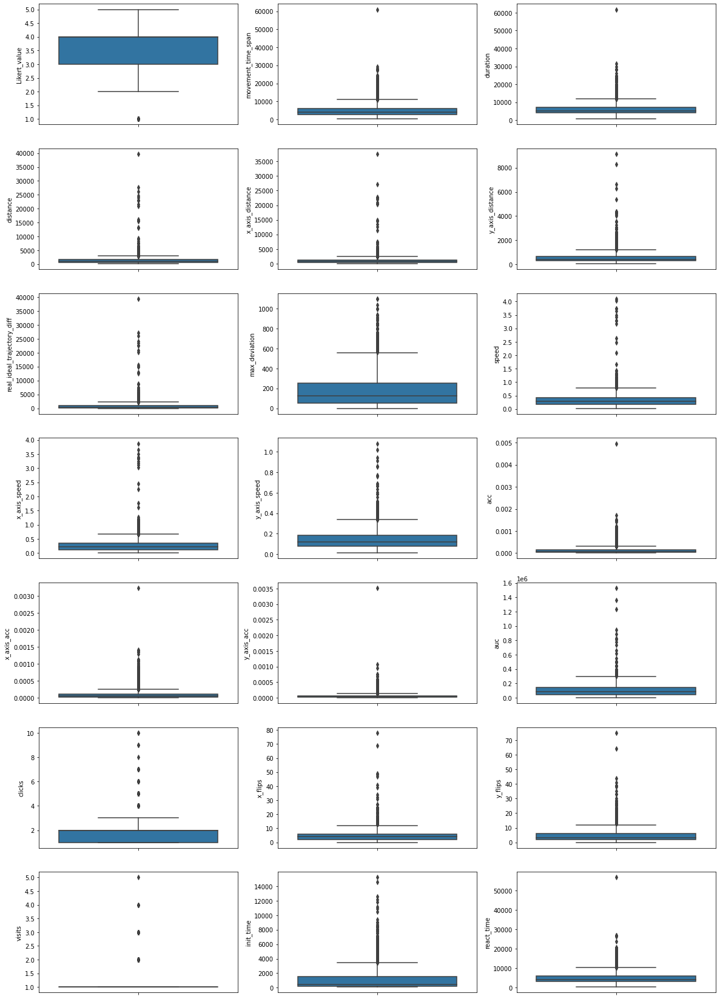

In [42]:
if other_plots:
    show_boxplots(None, columns_metrics, df_plots)

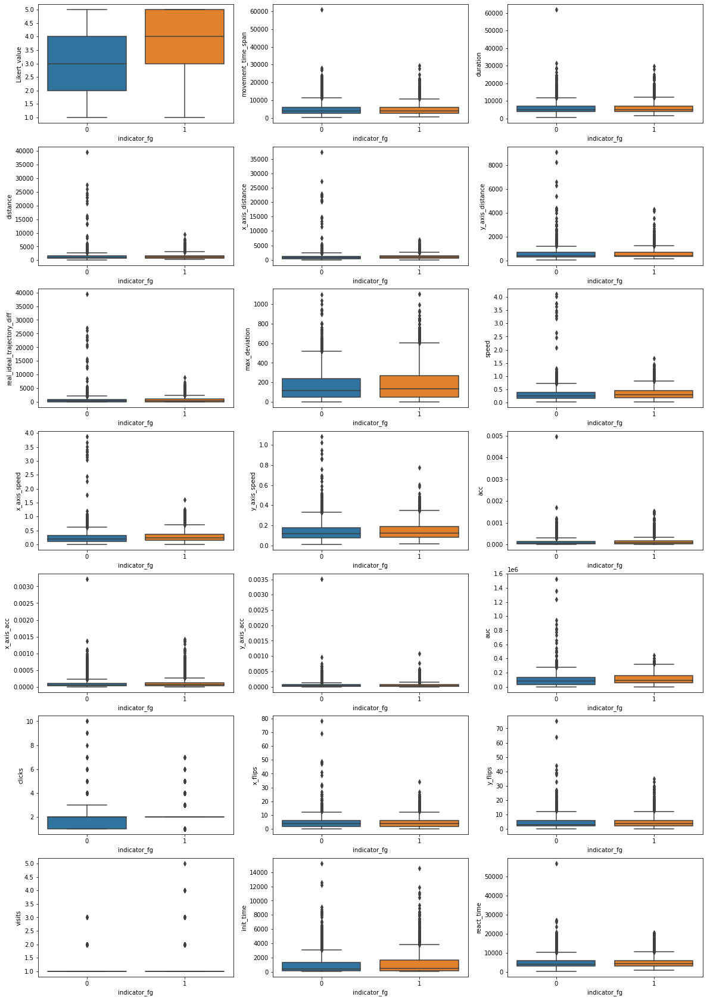

In [43]:
if other_plots:
    show_boxplots('indicator_fg', columns_metrics, df_plots)

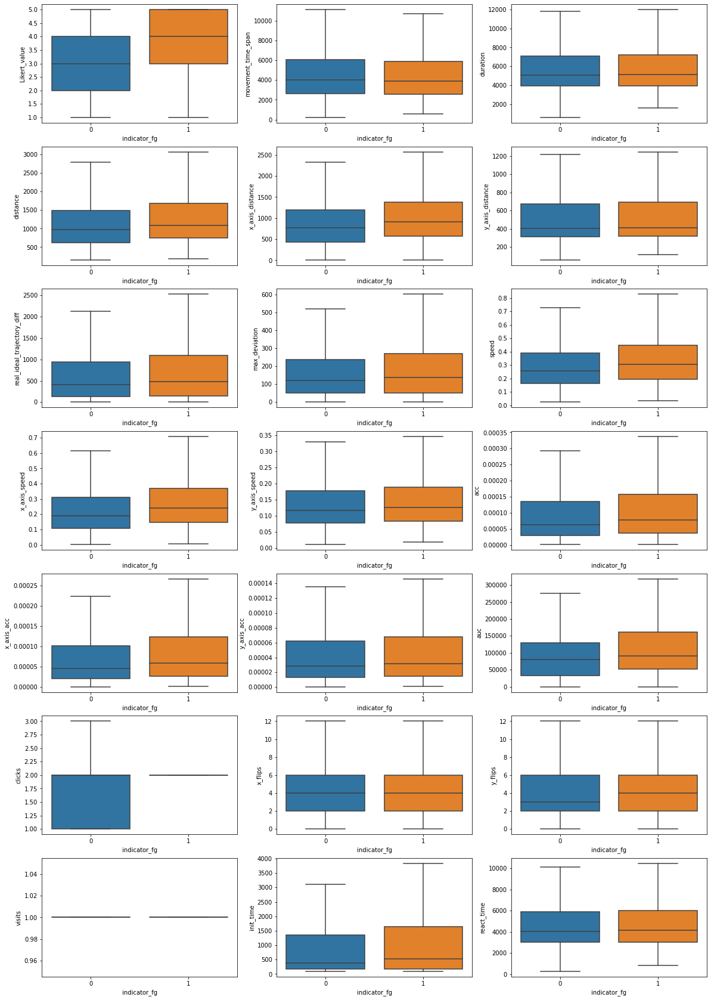

In [44]:
if other_plots:
    show_boxplots('indicator_fg', columns_metrics, df_plots, False)

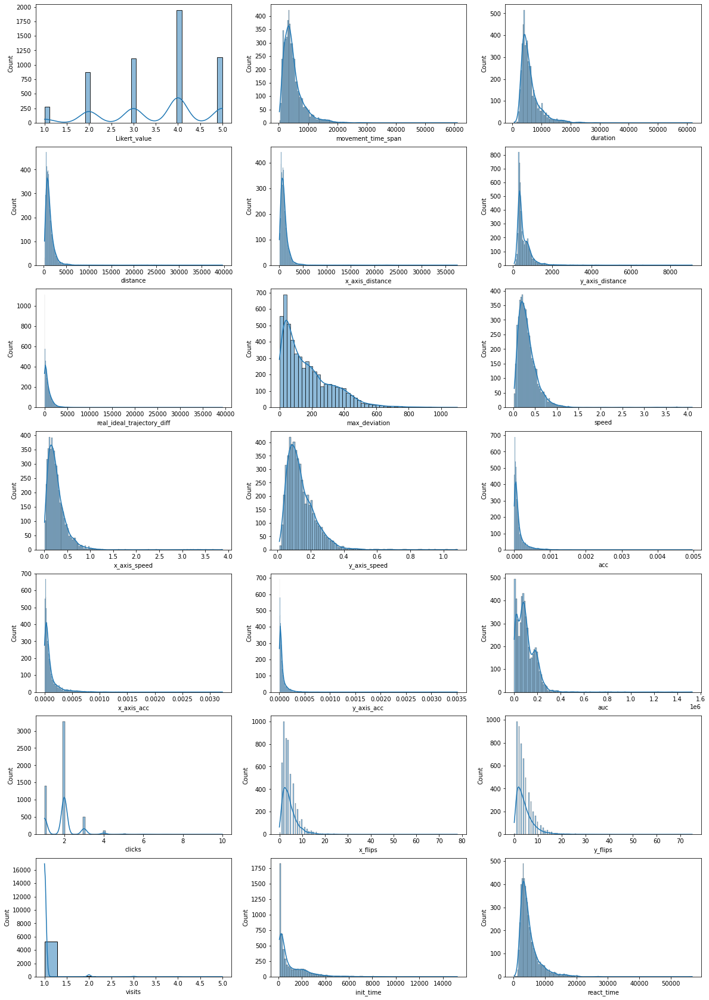

In [45]:
if other_plots:
    show_histograms(columns_metrics, df_plots, None, True)

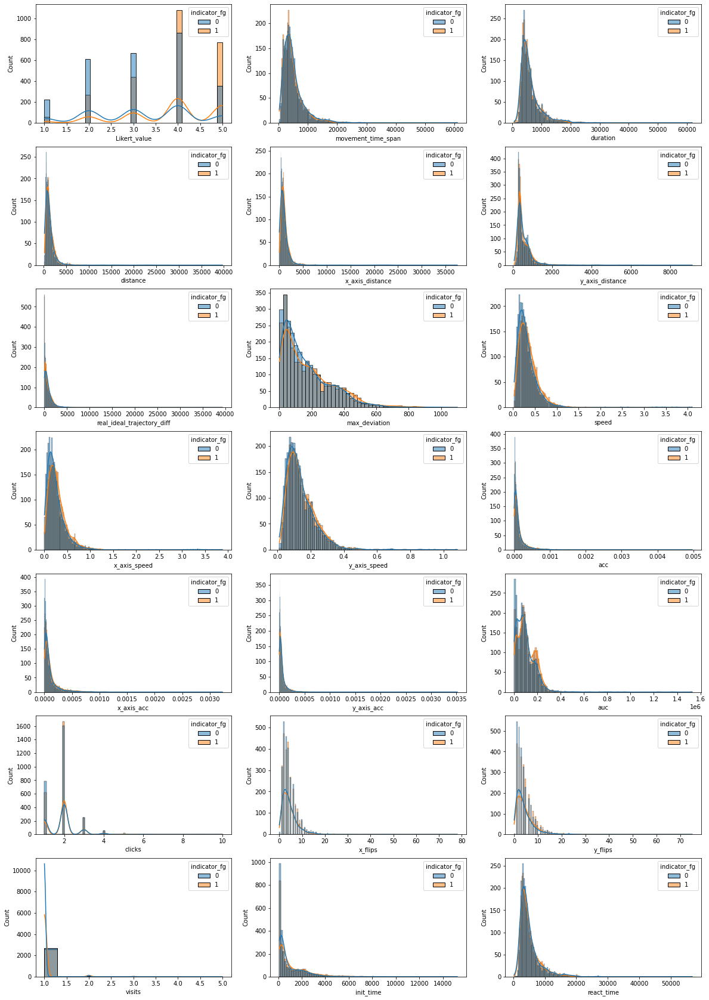

In [46]:
if other_plots:
    show_histograms(columns_metrics, df_plots, 'indicator_fg', True)

In [47]:
identify_outliers(df_plots.fillna(0))
plot_withoutOut = remove_outliers(df_plots.fillna(0))

indicator_fg Identified outliers: 0
Page Identified outliers: 0
Likert_value Identified outliers: 278
movement_time_span Identified outliers: 314
duration Identified outliers: 335
distance Identified outliers: 255
x_axis_distance Identified outliers: 250
y_axis_distance Identified outliers: 214
real_ideal_trajectory_diff Identified outliers: 277
max_deviation Identified outliers: 112
speed Identified outliers: 187
x_axis_speed Identified outliers: 228
y_axis_speed Identified outliers: 134
acc Identified outliers: 528
x_axis_acc Identified outliers: 559
y_axis_acc Identified outliers: 515
auc Identified outliers: 58
clicks Identified outliers: 161
x_flips Identified outliers: 159
y_flips Identified outliers: 201
visits Identified outliers: 111
init_time Identified outliers: 254
react_time Identified outliers: 353
Sum of identified outliers: 5483


In [48]:
plot_withoutOut = df_plots[(np.abs(stats.zscore(df_plots.fillna(0))) < 3).all(axis=1)]

In [49]:
len(plot_withoutOut)

4685

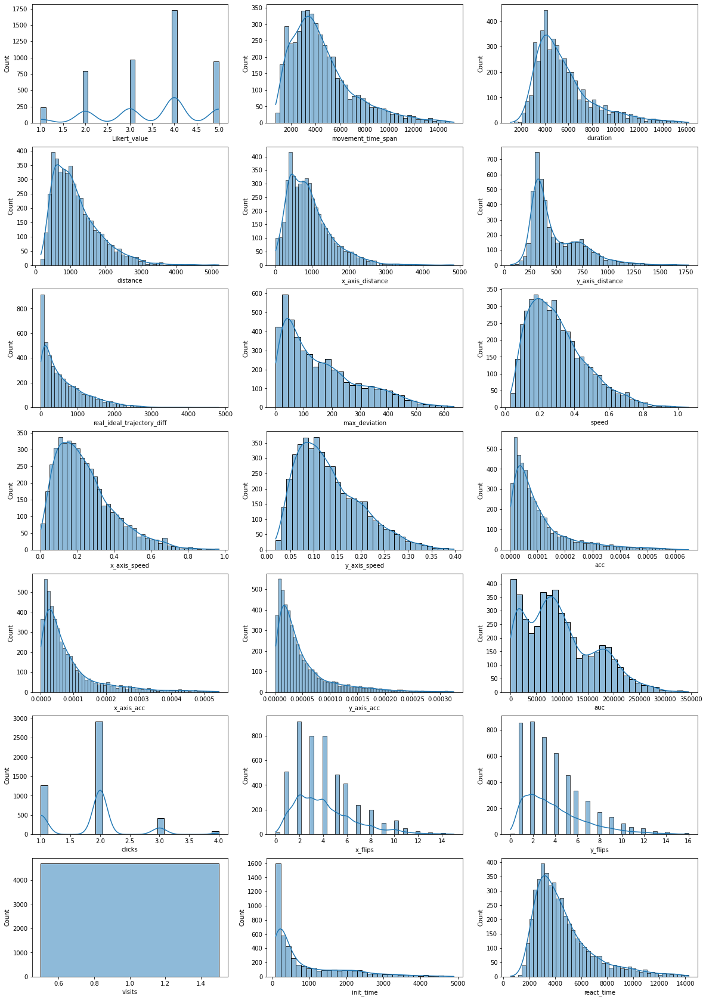

In [50]:
if other_plots:
    show_histograms(columns_metrics, plot_withoutOut, None, True)

Error - col visits


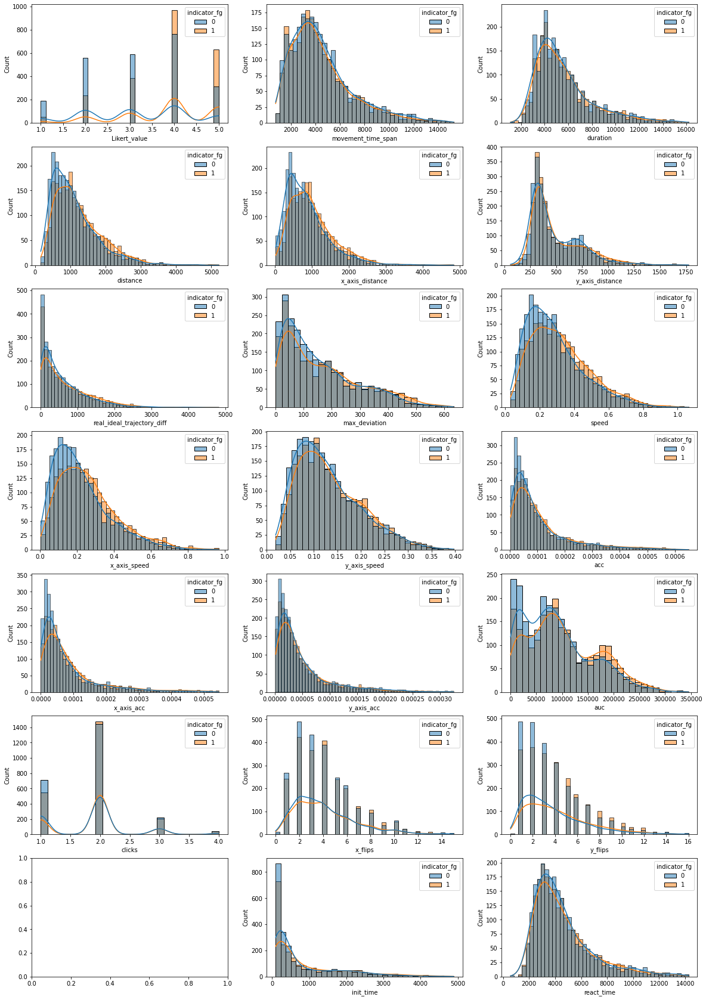

In [51]:
if other_plots:
    show_histograms(columns_metrics, plot_withoutOut, 'indicator_fg', True)

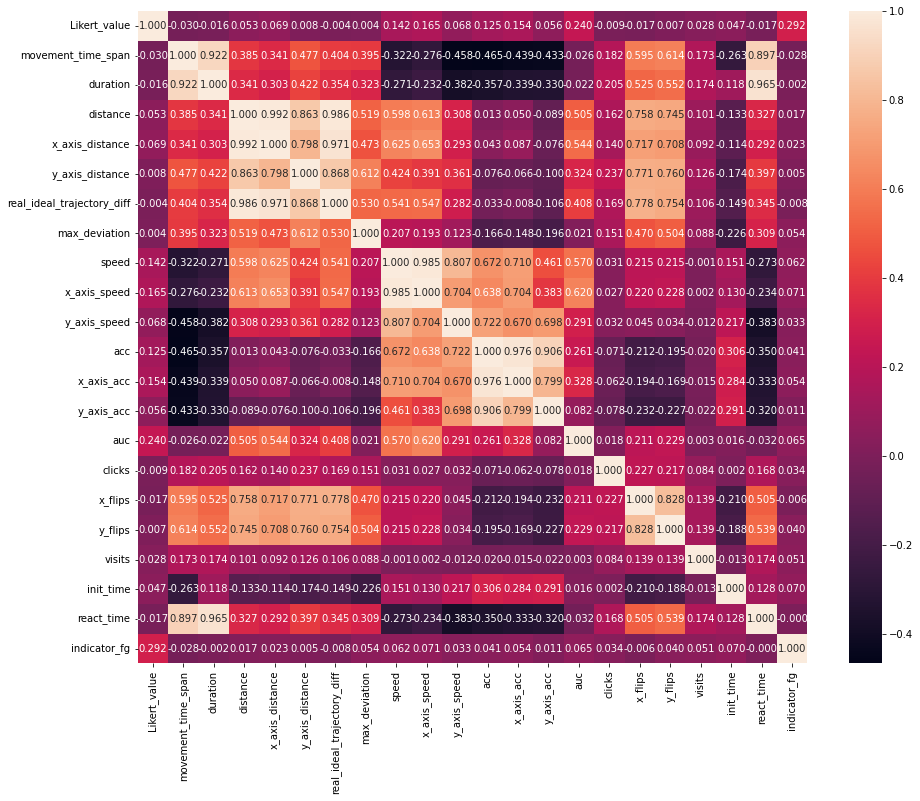

In [52]:
fig, ax = plt.subplots(figsize=(15,12))
df_corr = df_plots[columns_metrics + ['indicator_fg']].corr()
if other_plots:
    sns.heatmap(df_corr, ax=ax, annot=True, fmt=".3f")

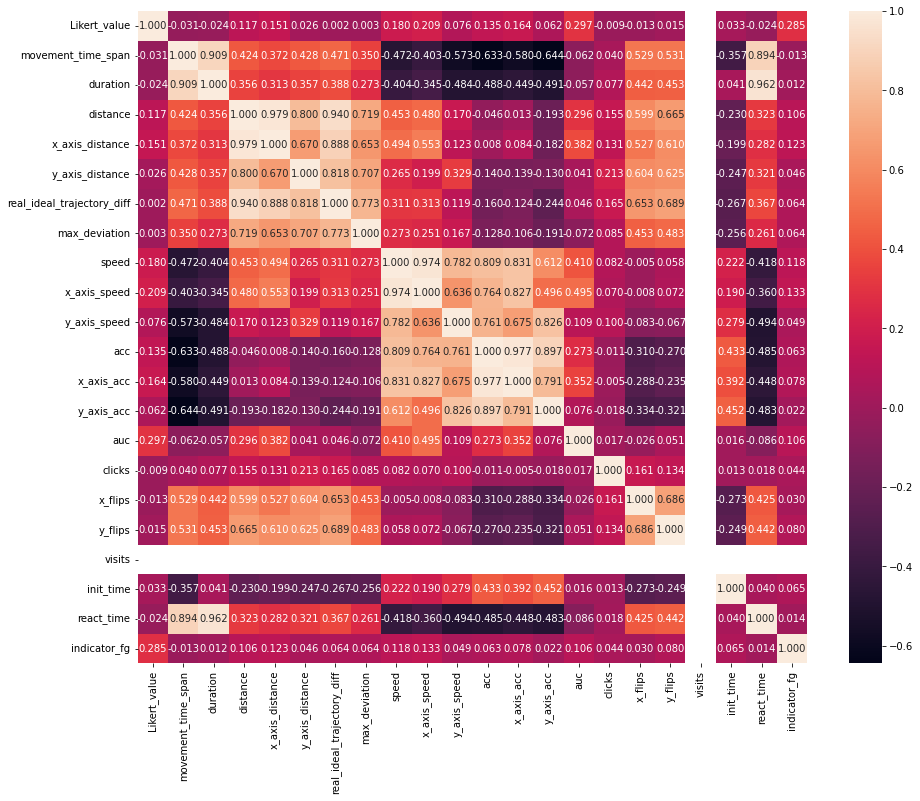

In [53]:
fig, ax = plt.subplots(figsize=(15,12))
df_corr = plot_withoutOut[columns_metrics + ['indicator_fg']].corr()
if other_plots:
    sns.heatmap(df_corr, ax=ax, annot=True, fmt=".3f")

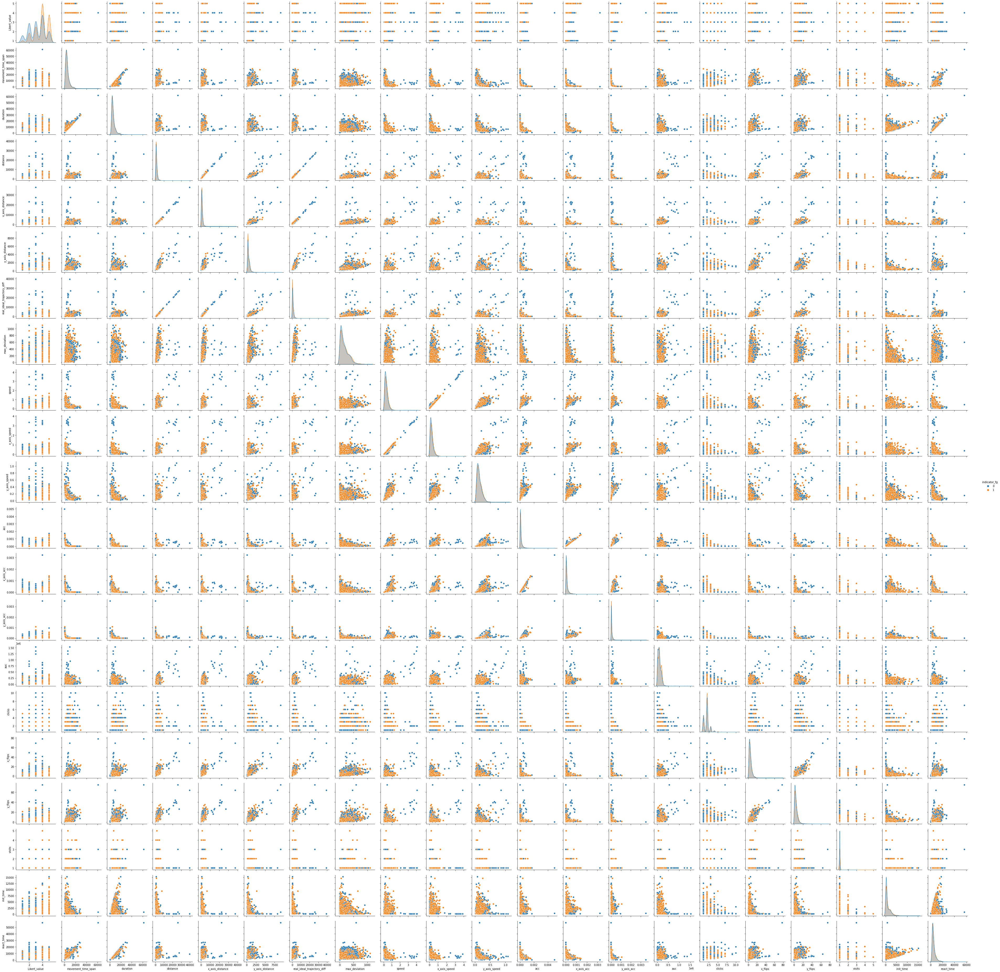

In [54]:
if plot_pairplots:
    sns.pairplot(df_plots, hue="indicator_fg", dropna=True, vars=columns_metrics)

### Only statistical test passed features

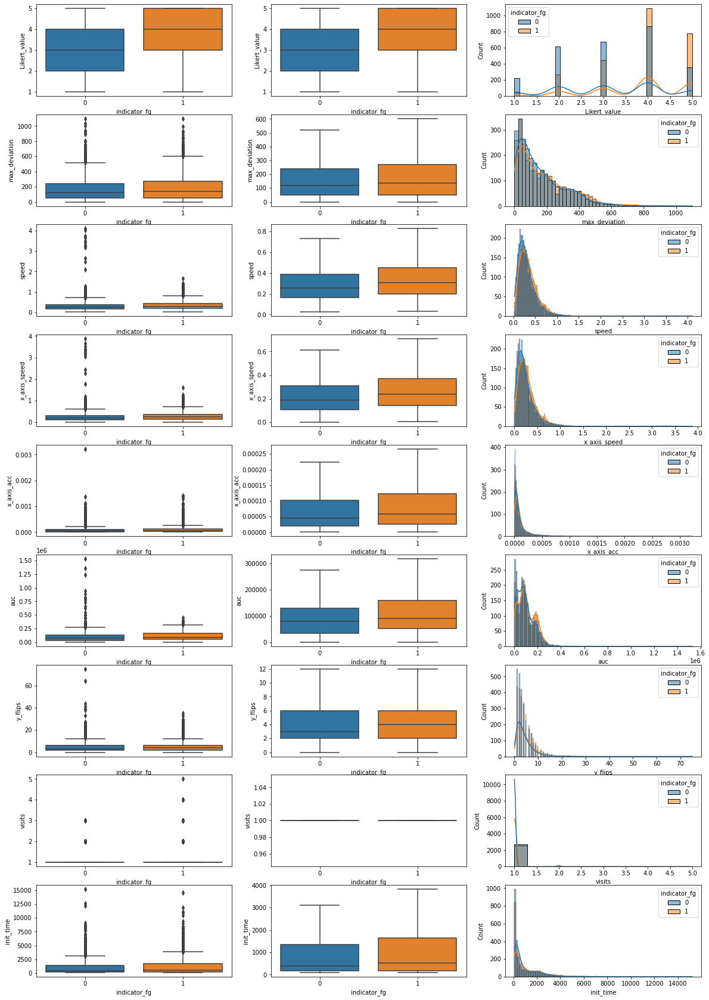

In [55]:
if other_plots:
    show_box_boxwithout_hist('indicator_fg', selected_features, df_plots, True)

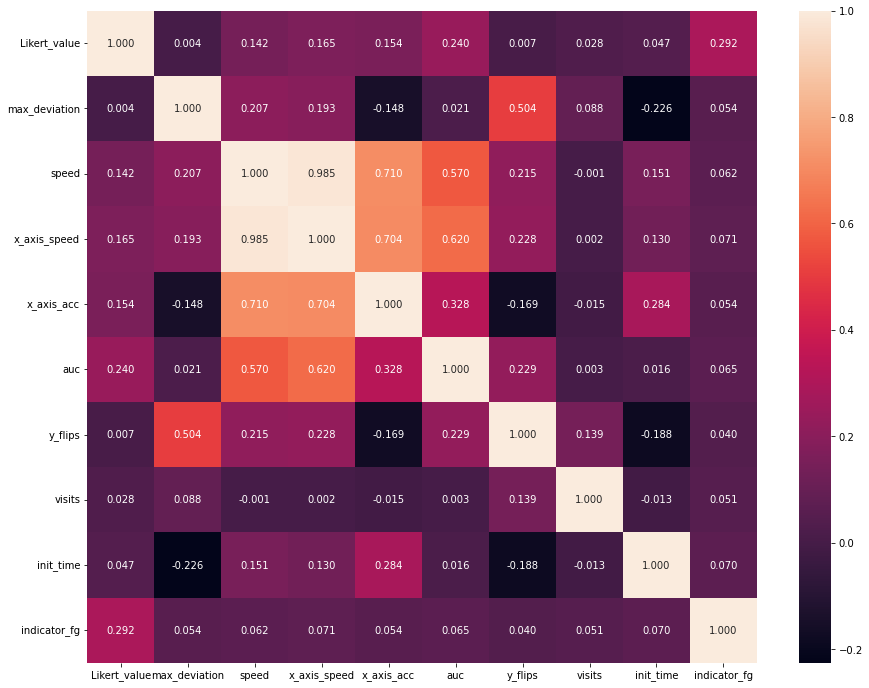

In [56]:
fig, ax = plt.subplots(figsize=(15,12))
df_corr = df_plots[selected_features + ['indicator_fg']].corr()
if other_plots:
    sns.heatmap(df_corr, ax=ax, annot=True, fmt=".3f")

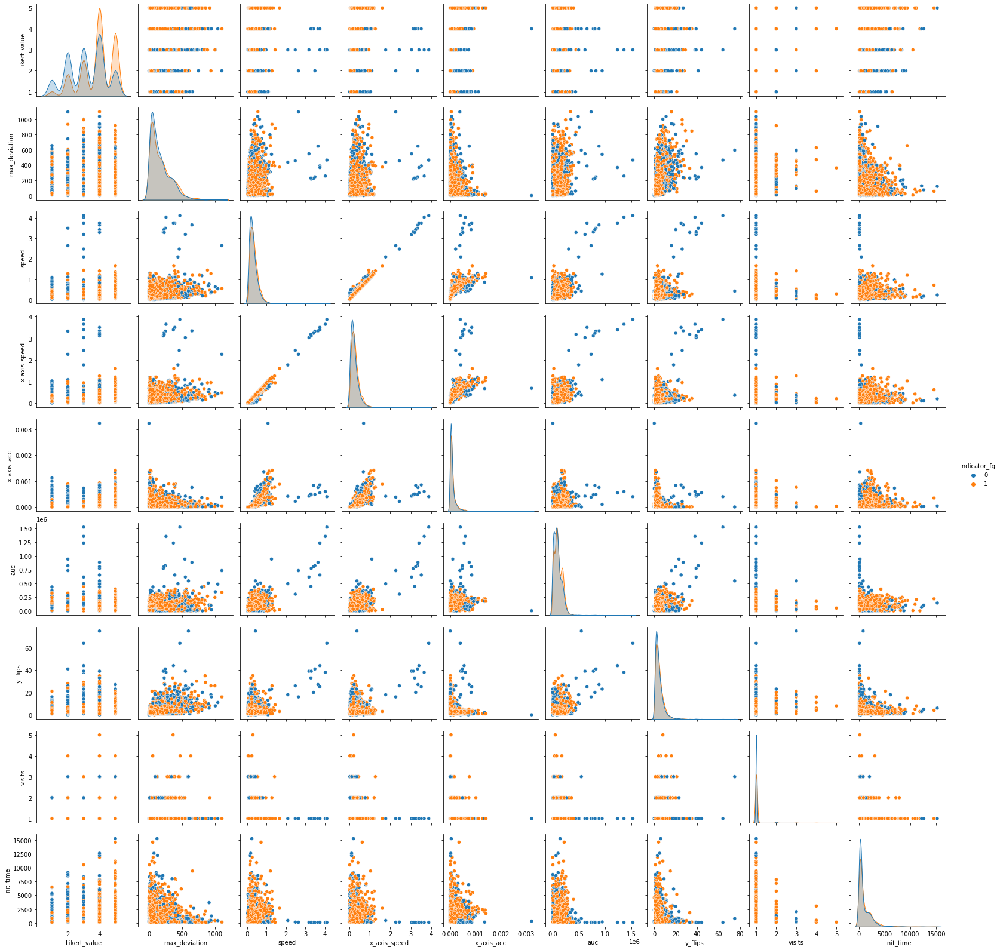

In [57]:
if plot_pairplots:
    sns.pairplot(df_plots, hue="indicator_fg", dropna=True, vars=selected_features)

## Feature selection

The following code is insipred by official documentation.

In [58]:
if lasso:
    X_train_lasso = df_to_train.drop(['indicator_fg', 'Page'], axis=1)
    y_train_lasso = df_to_train['indicator_fg']

In [59]:
if lasso:
    lsvc = LinearSVC(C=0.03, penalty="l1", dual=False).fit(X_train_lasso, y_train_lasso)
    model = SelectFromModel(lsvc, prefit=True)
    X_new = model.transform(X_train_lasso)
    X_new.shape

C:\Users\PeterSmrecek\Documents\BP\BP-venv\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\PeterSmrecek\Documents\BP\BP-venv\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


In [60]:
if lasso:
    selected_features = X_train_lasso.columns[(model.get_support())]
    selected_features = list(selected_features)
selected_features

['Likert_value',
 'movement_time_span',
 'duration',
 'distance',
 'x_axis_distance',
 'y_axis_distance',
 'real_ideal_trajectory_diff',
 'max_deviation',
 'y_flips',
 'visits',
 'init_time',
 'react_time']

In [61]:
if lasso:
    export_lasso_df = pd.DataFrame({'Feature': list(X_train_lasso.columns), 'Weight': lsvc.coef_.tolist()[0]}) 
    export_lasso_df['Selected'] = export_lasso_df['Feature'].apply(lambda x: x in selected_features)
    export_lasso_df.index = np.arange(1, len(export_lasso_df) + 1)
    export_lasso_df

In [62]:
if lasso:
    export_lasso_df.to_excel(r'C:\Users\PeterSmrecek\Documents\Exports\Lasso-test_results.xlsx', sheet_name='Lasso-test results', index=True)

In [63]:
df_to_test2 = df_to_test[selected_features + ["indicator_fg"]]
df_to_train = df_to_train[selected_features + ["indicator_fg"]]

## Divide

In [64]:
X_train = df_to_train.drop(["indicator_fg"], axis=1)
X_test = df_to_test2.drop(["indicator_fg"], axis=1)
y_train = df_to_train['indicator_fg']
y_test = df_to_test2['indicator_fg']

# Machine Learning for metrics over **1 row = 1 pageview** dataframe

The following function is taken from my project developed on the subject Intelligent Data Analysis 2021/2022.

In [65]:
def report_generator(pred_train, pred_test, y_train, y_test, driver_silent, zero_division='warn'):
    if not driver_silent:
        print("Predicting for train dataset:")
        print(classification_report(y_train, pred_train, zero_division=zero_division))

        print("Predicting for test dataset:")
        print(classification_report(y_test, pred_test, zero_division=zero_division))
    
    report_train = classification_report(y_train, pred_train, output_dict=True, zero_division=zero_division)
    report_test = classification_report(y_test, pred_test, output_dict=True, zero_division=zero_division)
    
    return report_train, report_test

In [66]:
global_report = None

def add_to_global_report(global_report, report, algo, d_set):
    dictionary = report.copy()
    dictionary['algorithm'] = algo
    dictionary['set'] = d_set
    pd_temp = pd.DataFrame({ key: dictionary[key] for key in ['algorithm', 'set', 'accuracy', '0', '1', 'macro avg', 'weighted avg'] })
    
    if global_report is None:
        global_report = pd_temp
    else:
        global_report = pd.concat([global_report, pd_temp], axis=0)
    
    return global_report

## Decision Tree

In [67]:
print(len(X_train), len(X_test), len(y_train), len(y_test))

3630 1714 3630 1714


The following function is taken from my project developed on the subject Intelligent Data Analysis 2021/2022.

In [68]:
def decisionTreeDriver(X_train, X_test, y_train, y_test, driver_silent=True, max_depth=None):
    clf = DecisionTreeClassifier(max_depth=max_depth, random_state=random_state)
    clf.fit(X_train, y_train)
    
    pred_train = clf.predict(X_train)
    pred_test = clf.predict(X_test)
    
    return clf, *report_generator(pred_train, pred_test, y_train, y_test, driver_silent)

In [69]:
clf1, train_report1, test_report1 = decisionTreeDriver(X_train, X_test, y_train, y_test, driver_silent=False)

Predicting for train dataset:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1864
           1       1.00      1.00      1.00      1766

    accuracy                           1.00      3630
   macro avg       1.00      1.00      1.00      3630
weighted avg       1.00      1.00      1.00      3630

Predicting for test dataset:
              precision    recall  f1-score   support

           0       0.54      0.53      0.53       858
           1       0.53      0.54      0.54       856

    accuracy                           0.54      1714
   macro avg       0.54      0.54      0.54      1714
weighted avg       0.54      0.54      0.54      1714



## Random Forest

The following function is taken from my project developed on the subject Intelligent Data Analysis 2021/2022.

In [70]:
def randomForestDriver(X_train, X_test, y_train, y_test, driver_silent=True, max_depth=None,
                       criterion='gini', max_features='auto', min_samples_leaf=1, n_estimators=100):
    clf = RandomForestClassifier(random_state=random_state, criterion=criterion, max_depth=max_depth,
                                 max_features=max_features, min_samples_leaf=min_samples_leaf, n_estimators=n_estimators)
    clf.fit(X_train, y_train)
    
    pred_train = clf.predict(X_train)
    pred_test = clf.predict(X_test)
    
    return clf, *report_generator(pred_train, pred_test, y_train, y_test, driver_silent)

In [71]:
clf2, train_report2, test_report2 = randomForestDriver(X_train, X_test, y_train, y_test, driver_silent=False)

Predicting for train dataset:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1864
           1       1.00      1.00      1.00      1766

    accuracy                           1.00      3630
   macro avg       1.00      1.00      1.00      3630
weighted avg       1.00      1.00      1.00      3630

Predicting for test dataset:
              precision    recall  f1-score   support

           0       0.62      0.63      0.62       858
           1       0.62      0.61      0.61       856

    accuracy                           0.62      1714
   macro avg       0.62      0.62      0.62      1714
weighted avg       0.62      0.62      0.62      1714



## SVM

In [72]:
from sklearn import svm

def SVMDriver(X_train, X_test, y_train, y_test, driver_silent=True, kernel='rbf', zero_division='warn'):
    clf = svm.SVC(kernel=kernel, random_state=random_state)
    clf.fit(X_train, y_train)
    
    pred_train = clf.predict(X_train)
    pred_test = clf.predict(X_test)
    
    return clf, *report_generator(pred_train, pred_test, y_train, y_test, driver_silent, zero_division=zero_division)

In [73]:
# clf3_a, train_report3_a, test_report3_a = SVMDriver(X_train, X_test, y_train, y_test, driver_silent=False, kernel='linear', zero_division=0)

In [74]:
clf3_b, train_report3_b, test_report3_b = SVMDriver(X_train, X_test, y_train, y_test, driver_silent=False, kernel='poly', zero_division=0)

Predicting for train dataset:
              precision    recall  f1-score   support

           0       0.52      0.96      0.68      1864
           1       0.65      0.07      0.13      1766

    accuracy                           0.53      3630
   macro avg       0.59      0.52      0.40      3630
weighted avg       0.59      0.53      0.41      3630

Predicting for test dataset:
              precision    recall  f1-score   support

           0       0.50      0.96      0.66       858
           1       0.57      0.05      0.10       856

    accuracy                           0.51      1714
   macro avg       0.54      0.51      0.38      1714
weighted avg       0.54      0.51      0.38      1714



In [75]:
clf3_c, train_report3_c, test_report3_c = SVMDriver(X_train, X_test, y_train, y_test, driver_silent=False, kernel='rbf', zero_division=0)

Predicting for train dataset:
              precision    recall  f1-score   support

           0       0.56      0.72      0.63      1864
           1       0.58      0.41      0.48      1766

    accuracy                           0.57      3630
   macro avg       0.57      0.56      0.56      3630
weighted avg       0.57      0.57      0.56      3630

Predicting for test dataset:
              precision    recall  f1-score   support

           0       0.55      0.71      0.62       858
           1       0.59      0.42      0.49       856

    accuracy                           0.56      1714
   macro avg       0.57      0.56      0.55      1714
weighted avg       0.57      0.56      0.55      1714



In [76]:
clf3_d, train_report3_d, test_report3_d = SVMDriver(X_train, X_test, y_train, y_test, driver_silent=False, kernel='sigmoid', zero_division=0)

Predicting for train dataset:
              precision    recall  f1-score   support

           0       0.49      0.49      0.49      1864
           1       0.46      0.46      0.46      1766

    accuracy                           0.48      3630
   macro avg       0.48      0.48      0.48      3630
weighted avg       0.48      0.48      0.48      3630

Predicting for test dataset:
              precision    recall  f1-score   support

           0       0.52      0.54      0.53       858
           1       0.52      0.51      0.51       856

    accuracy                           0.52      1714
   macro avg       0.52      0.52      0.52      1714
weighted avg       0.52      0.52      0.52      1714



## Gradient Boosting

In [77]:
from sklearn.ensemble import GradientBoostingClassifier

def GradientBoostingDriver(X_train, X_test, y_train, y_test, driver_silent=True):
    clf = GradientBoostingClassifier(max_features='sqrt', random_state=random_state)
    clf.fit(X_train, y_train)
    
    pred_train = clf.predict(X_train)
    pred_test = clf.predict(X_test)
    
    return clf, *report_generator(pred_train, pred_test, y_train, y_test, driver_silent)

In [78]:
clf4, train_report4, test_report4 = GradientBoostingDriver(X_train, X_test, y_train, y_test, driver_silent=False)

Predicting for train dataset:
              precision    recall  f1-score   support

           0       0.71      0.71      0.71      1864
           1       0.69      0.70      0.70      1766

    accuracy                           0.70      3630
   macro avg       0.70      0.70      0.70      3630
weighted avg       0.70      0.70      0.70      3630

Predicting for test dataset:
              precision    recall  f1-score   support

           0       0.64      0.65      0.64       858
           1       0.64      0.63      0.64       856

    accuracy                           0.64      1714
   macro avg       0.64      0.64      0.64      1714
weighted avg       0.64      0.64      0.64      1714



## Logistic Regression

In [79]:
from sklearn.linear_model import LogisticRegression

def LogisticRegressionDriver(X_train, X_test, y_train, y_test, driver_silent=True):
    clf = LogisticRegression(max_iter=2000000, penalty='l1', solver='liblinear', random_state=random_state)
    clf.fit(X_train, y_train)
    
    pred_train = clf.predict(X_train)
    pred_test = clf.predict(X_test)
    
    return clf, *report_generator(pred_train, pred_test, y_train, y_test, driver_silent)

In [80]:
clf5, train_report5, test_report5 = LogisticRegressionDriver(X_train, X_test, y_train, y_test, driver_silent=False)

Predicting for train dataset:
              precision    recall  f1-score   support

           0       0.65      0.62      0.63      1864
           1       0.61      0.64      0.63      1766

    accuracy                           0.63      3630
   macro avg       0.63      0.63      0.63      3630
weighted avg       0.63      0.63      0.63      3630

Predicting for test dataset:
              precision    recall  f1-score   support

           0       0.65      0.60      0.63       858
           1       0.63      0.68      0.65       856

    accuracy                           0.64      1714
   macro avg       0.64      0.64      0.64      1714
weighted avg       0.64      0.64      0.64      1714



## XGBoost 

In [81]:
import xgboost as xgb

def xgboostDriver(X_train, X_test, y_train, y_test, driver_silent=True):
    # binary:logistic 75, binary:logitraw 69, binary:hinge 78, rank:pairwise 78, reg:logistic 75
    # clf = xgb.XGBClassifier(n_estimators=1000, objective='binary:hinge', random_state=random_state, colsample_bytree=0.7, learning_rate=0.01, max_depth=3, subsample=0.5, min_child_weight=0.8)
    clf = xgb.XGBClassifier(n_estimators=1000, objective='binary:hinge', random_state=random_state)
    clf.fit(X_train, y_train)
    
    pred_train = clf.predict(X_train)
    pred_test = clf.predict(X_test)
    
    return clf, *report_generator(pred_train, pred_test, y_train, y_test, driver_silent)

In [82]:
clf6, train_report6, test_report6 = xgboostDriver(X_train, X_test, y_train, y_test, driver_silent=False)

Predicting for train dataset:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1864
           1       0.93      0.94      0.94      1766

    accuracy                           0.94      3630
   macro avg       0.94      0.94      0.94      3630
weighted avg       0.94      0.94      0.94      3630

Predicting for test dataset:
              precision    recall  f1-score   support

           0       0.59      0.59      0.59       858
           1       0.59      0.59      0.59       856

    accuracy                           0.59      1714
   macro avg       0.59      0.59      0.59      1714
weighted avg       0.59      0.59      0.59      1714



# Second layer test

In [83]:
from sklearn.metrics import roc_curve, auc

def roc_curve_generator(y_test, y_score, pos_label, new_title=None):
    # Compute ROC curve, ROC area, and find the optimal cutoff
    fpr, tpr, thresholds = roc_curve(y_test, y_score, pos_label=1)
    roc_auc = auc(fpr, tpr)

    # Calculate Youden's J statistic
    youden_j = tpr - fpr

    # Find the optimal cutoff
    optimal_cutoff = thresholds[np.argmax(youden_j)]

    # Plot the ROC curve
    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f, cutoff = %0.2f)' % (roc_auc, optimal_cutoff))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc="lower right")
    if new_title is not None:
        plt.title(new_title)
        plt.savefig(f'roc.png', format='png', dpi=300)
    else:
        plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.show()

    print("Optimal cutoff:", optimal_cutoff)
    
    return optimal_cutoff

In [84]:
def second_layer(clf, df_to_test_outer, columns, X_train, y_train, perform_cv = False, new_title=None):
    
    if perform_cv:
        # evaluate the model
        cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=11)
        n_scores = cross_val_score(clf, X_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
        print('Cross validation accuracy of clf is {:.3f} with std {:.3f} (for pages)'.format(mean(n_scores), std(n_scores)))

    df_to_test = df_to_test_outer.copy(deep=True)

    try:
        y_score = clf.predict_proba(X_test)
        optimal_cutoff = roc_curve_generator(y_test, y_score[:, 1], 1)
        new_column = (clf.predict_proba(df_to_test[columns])[:, 1] >= optimal_cutoff).astype(int)
    except:
        new_column = clf.predict(df_to_test[columns])

    df_pages_counts = df_to_test.groupby(['Session']).count()['movement_time_span']
    df_to_test['classified'] = new_column
    df_to_test_group = df_to_test.groupby(['Session', 'indicator_fg', 'classified']).count()
    num_correctly_clasified_PVs = df_to_test[df_to_test['classified'] == df_to_test['indicator_fg']].count()['classified']
    print('Correct classification in {:.2f}% of test pageviews'.format(num_correctly_clasified_PVs / len(df_to_test) * 100))
    # df_to_test_group[['Page']]
    
    df_to_test_result = df_to_test.groupby(['Session', 'indicator_fg', 'classified']).count()    
    df_to_test_result = df_to_test_result.reset_index()
    
    df_to_test_result = df_to_test_result[['Session', 'indicator_fg', 'classified', 'Page']]    
    df_to_test_result = df_to_test_result[df_to_test_result['classified'] == 1]        
    df_to_test_result = df_to_test_result.join(df_pages_counts, on='Session')
    
    df_to_test_result['Liar probability'] = df_to_test_result['Page'] / df_to_test_result['movement_time_span'] * 100
    optimal_cutoff_session = roc_curve_generator(df_to_test_result['indicator_fg'], df_to_test_result['Liar probability'], 1, new_title)
    df_to_test_result['Liar classified'] = df_to_test_result[['Liar probability']].apply(lambda x: [1 if y >= optimal_cutoff_session else 0 for y in x])
    df_to_test_result[['Session', 'indicator_fg', 'Liar classified', 'Liar probability']]
    print(df_to_test_result['Liar probability'].describe())

    sample_size = len(df_to_test_result)
    correct_class_df = df_to_test_result[df_to_test_result['indicator_fg'] == df_to_test_result['Liar classified']]
    print('Correct classification in {:.2f}% of test sessions (for sessions)'.format(len(correct_class_df) / sample_size * 100))
    # print('F1 score - binary: {:.2f}%'.format(f1_score(df_to_test_result['indicator_fg'], df_to_test_result['classified'], average='binary') * 100))
    # print('F1 score - macro: {:.2f}%'.format(f1_score(df_to_test_result['indicator_fg'], df_to_test_result['classified'], average='macro') * 100))
    # print('F1 score - micro: {:.2f}%'.format(f1_score(df_to_test_result['indicator_fg'], df_to_test_result['classified'], average='micro') * 100))
    # print('F1 score - weighted: {:.2f}%'.format(f1_score(df_to_test_result['indicator_fg'], df_to_test_result['classified'], average='weighted') * 100))
    
    print(classification_report(df_to_test_result['indicator_fg'], df_to_test_result['Liar classified']))
    report = classification_report(df_to_test_result['indicator_fg'], df_to_test_result['Liar classified'], output_dict=True)
    print('F1 score - macro avg: {:.2f}%'.format(report['macro avg']['f1-score'] * 100))
    print('F1 score - weighted avg: {:.2f}%'.format(report['weighted avg']['f1-score'] * 100))
    return report

In [85]:
global_report = None

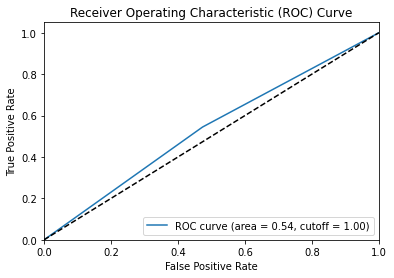

Optimal cutoff: 1.0
Correct classification in 53.56% of test pageviews


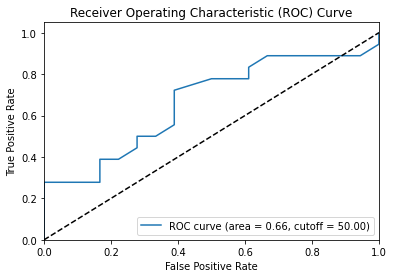

Optimal cutoff: 50.0
count    36.000000
mean     50.869840
std      11.342478
min      31.250000
25%      40.425532
50%      50.000000
75%      57.916667
max      72.916667
Name: Liar probability, dtype: float64
Correct classification in 66.67% of test sessions (for sessions)
              precision    recall  f1-score   support

           0       0.69      0.61      0.65        18
           1       0.65      0.72      0.68        18

    accuracy                           0.67        36
   macro avg       0.67      0.67      0.67        36
weighted avg       0.67      0.67      0.67        36

F1 score - macro avg: 66.56%
F1 score - weighted avg: 66.56%


In [86]:
report1 = second_layer(clf1, df_to_test, X_train.columns, X_train, y_train)

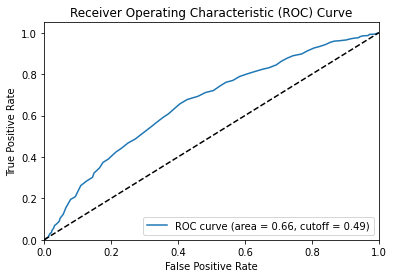

Optimal cutoff: 0.49
Correct classification in 62.54% of test pageviews


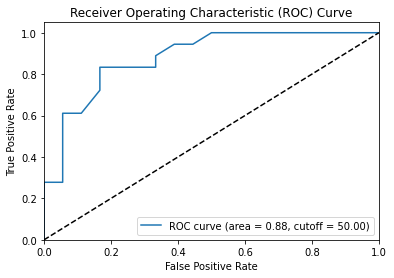

Optimal cutoff: 50.0
count    36.000000
mean     53.085917
std      19.061363
min      19.565217
25%      38.730053
50%      49.468085
75%      70.833333
max      91.666667
Name: Liar probability, dtype: float64
Correct classification in 83.33% of test sessions (for sessions)
              precision    recall  f1-score   support

           0       0.83      0.83      0.83        18
           1       0.83      0.83      0.83        18

    accuracy                           0.83        36
   macro avg       0.83      0.83      0.83        36
weighted avg       0.83      0.83      0.83        36

F1 score - macro avg: 83.33%
F1 score - weighted avg: 83.33%


In [87]:
report2 = second_layer(clf2, df_to_test, X_train.columns, X_train, y_train)

In [88]:
# report3_a = second_layer(clf3_a, df_to_test, X_train.columns, X_train, y_train)

In [89]:
# report3_b = second_layer(clf3_b, df_to_test, X_train.columns, X_train, y_train)

Correct classification in 56.36% of test pageviews


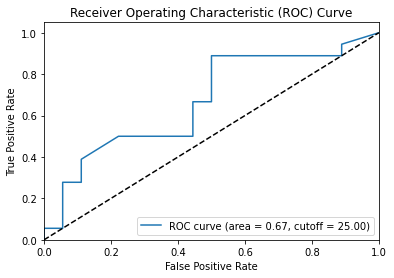

Optimal cutoff: 25.0
count    36.000000
mean     35.731811
std      21.426428
min       6.250000
25%      20.833333
50%      30.208333
75%      46.875000
max      91.666667
Name: Liar probability, dtype: float64
Correct classification in 69.44% of test sessions (for sessions)
              precision    recall  f1-score   support

           0       0.82      0.50      0.62        18
           1       0.64      0.89      0.74        18

    accuracy                           0.69        36
   macro avg       0.73      0.69      0.68        36
weighted avg       0.73      0.69      0.68        36

F1 score - macro avg: 68.24%
F1 score - weighted avg: 68.24%


In [90]:
report3_c = second_layer(clf3_c, df_to_test, X_train.columns, X_train, y_train)

Correct classification in 52.39% of test pageviews


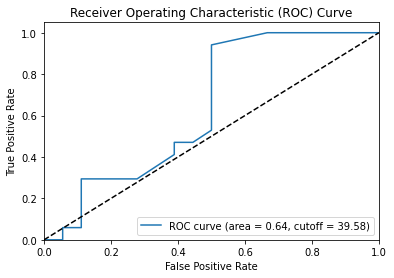

Optimal cutoff: 39.58333333333333
count    35.000000
mean     49.500606
std      16.278656
min      18.750000
25%      37.500000
50%      50.000000
75%      58.953901
max      85.106383
Name: Liar probability, dtype: float64
Correct classification in 71.43% of test sessions (for sessions)
              precision    recall  f1-score   support

           0       0.90      0.50      0.64        18
           1       0.64      0.94      0.76        17

    accuracy                           0.71        35
   macro avg       0.77      0.72      0.70        35
weighted avg       0.77      0.71      0.70        35

F1 score - macro avg: 70.24%
F1 score - weighted avg: 70.07%


In [91]:
report3_d = second_layer(clf3_d, df_to_test, X_train.columns, X_train, y_train)

Cross validation accuracy of clf is 0.640 with std 0.023 (for pages)


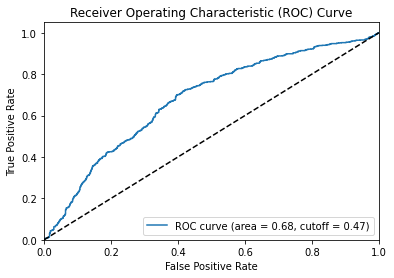

Optimal cutoff: 0.4679793990290736
Correct classification in 65.17% of test pageviews


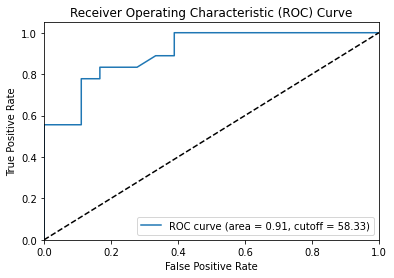

Optimal cutoff: 58.333333333333336
count    36.000000
mean     57.190823
std      21.817420
min      25.000000
25%      40.425532
50%      52.615248
75%      71.930408
max      97.916667
Name: Liar probability, dtype: float64
Correct classification in 83.33% of test sessions (for sessions)
              precision    recall  f1-score   support

           0       0.80      0.89      0.84        18
           1       0.88      0.78      0.82        18

    accuracy                           0.83        36
   macro avg       0.84      0.83      0.83        36
weighted avg       0.84      0.83      0.83        36

F1 score - macro avg: 83.28%
F1 score - weighted avg: 83.28%


In [92]:
report4 = second_layer(clf4, df_to_test, X_train.columns, X_train, y_train, perform_cv=True) # Gradient Boosting

Cross validation accuracy of clf is 0.627 with std 0.023 (for pages)


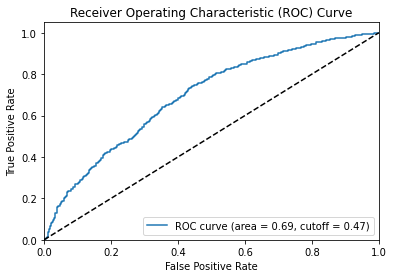

Optimal cutoff: 0.4745836264974763
Correct classification in 64.99% of test pageviews


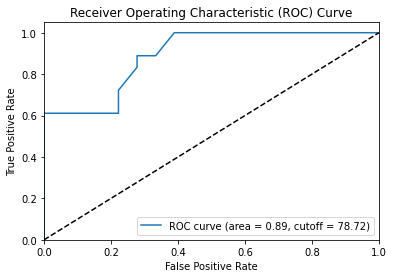

Optimal cutoff: 78.72340425531915
count    36.000000
mean     59.750724
std      22.477713
min      18.750000
25%      43.927305
50%      54.166667
75%      79.166667
max      97.916667
Name: Liar probability, dtype: float64
Correct classification in 80.56% of test sessions (for sessions)
              precision    recall  f1-score   support

           0       0.72      1.00      0.84        18
           1       1.00      0.61      0.76        18

    accuracy                           0.81        36
   macro avg       0.86      0.81      0.80        36
weighted avg       0.86      0.81      0.80        36

F1 score - macro avg: 79.79%
F1 score - weighted avg: 79.79%


In [93]:
report5 = second_layer(clf5, df_to_test, X_train.columns, X_train, y_train, perform_cv=True) # Logistic Regression

In [94]:
if lasso:
    title = "ROC Curve for prediction in the full questionnaire using XGBoost with LASSO selected features"
else:
    title = "ROC Curve for prediction in the full questionnaire using XGBoost with U-test selected features"

In [95]:
wrap_title = lambda x: '\n'.join(textwrap.wrap(title, width=x))

Cross validation accuracy of clf is 0.585 with std 0.022 (for pages)


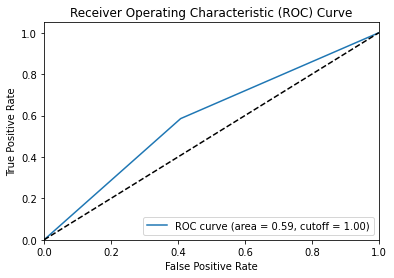

Optimal cutoff: 1.0
Correct classification in 58.87% of test pageviews


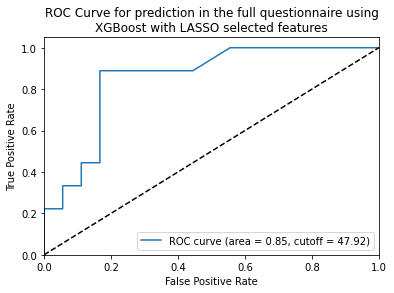

Optimal cutoff: 47.91666666666667
count    36.000000
mean     49.645561
std      14.689414
min      27.083333
25%      37.500000
50%      49.490248
75%      60.416667
max      81.250000
Name: Liar probability, dtype: float64
Correct classification in 86.11% of test sessions (for sessions)
              precision    recall  f1-score   support

           0       0.88      0.83      0.86        18
           1       0.84      0.89      0.86        18

    accuracy                           0.86        36
   macro avg       0.86      0.86      0.86        36
weighted avg       0.86      0.86      0.86        36

F1 score - macro avg: 86.10%
F1 score - weighted avg: 86.10%


In [96]:
report6 = second_layer(clf6, df_to_test, X_train.columns, X_train, y_train, perform_cv=True, new_title=wrap_title(60)) # XGBoost

In [97]:
fs_strategy = "U-test"
if lasso:
    fs_strategy = "Lasso"

global_report = add_to_global_report(global_report, report1, 'Decision Tree', fs_strategy)

global_report = add_to_global_report(global_report, report2, 'Random Forest', fs_strategy)

# global_report = add_to_global_report(global_report, report3_a, 'SVM - linear kernel', fs_strategy)

# global_report = add_to_global_report(global_report, report3_b, 'SVM - poly kernel', fs_strategy)

global_report = add_to_global_report(global_report, report3_c, 'SVM - rbf kernel', fs_strategy)

global_report = add_to_global_report(global_report, report3_d, 'SVM - sigmoid kernel', fs_strategy)

global_report = add_to_global_report(global_report, report4, 'Gradient Boosting', fs_strategy)

global_report = add_to_global_report(global_report, report5, 'Logistic Regression', fs_strategy)

global_report = add_to_global_report(global_report, report6, 'XGBoost', fs_strategy)

In [98]:
global_report['metrics'] = global_report.index
global_report = global_report.round(2)
global_report = global_report.set_index(['algorithm', 'set', 'accuracy', 'metrics'])

In [99]:
global_report

0      1  macro avg  \
algorithm            set   accuracy metrics                              
Decision Tree        Lasso 0.67     precision   0.69   0.65       0.67   
                                    recall      0.61   0.72       0.67   
                                    f1-score    0.65   0.68       0.67   
                                    support    18.00  18.00      36.00   
Random Forest        Lasso 0.83     precision   0.83   0.83       0.83   
                                    recall      0.83   0.83       0.83   
                                    f1-score    0.83   0.83       0.83   
                                    support    18.00  18.00      36.00   
SVM - rbf kernel     Lasso 0.69     precision   0.82   0.64       0.73   
                                    recall      0.50   0.89       0.69   
                                    f1-score    0.62   0.74       0.68   
                                    support    18.00  18.00      36.00   
SVM - sigmoid kernel Lasso 0.71     precision   0.90   0.64       0.77   
                                    recall      0.50   0.94       0.72   
                                    f1-score    0.64   0.76       0.70   
                                    support    18.00  17.00      35.00   
Gradient Boosting    Lasso 0.83     precision   0.80   0.88       0.84   
                                    recall      0.89   0.78       0.83   
                                    f1-score    0.84   0.82       0.83   
                                    support    18.00  18.00      36.00   
Logistic Regression  Lasso 0.81     precision   0.72   1.00       0.86   
                                    recall      1.00   0.61       0.81   
                                    f1-score    0.84   0.76       0.80   
                                    support    18.00  18.00      36.00   
XGBoost              Lasso 0.86     precision   0.88   0.84       0.86   
                                    recall      0.83   0.89       0.86   
                                    f1-score    0.86   0.86       0.86   
                                    support    18.00  18.00      36.00   

                                               weighted avg  
algorithm            set   accuracy metrics                  
Decision Tree        Lasso 0.67     precision          0.67  
                                    recall             0.67  
                                    f1-score           0.67  
                                    support           36.00  
Random Forest        Lasso 0.83     precision          0.83  
                                    recall             0.83  
                                    f1-score           0.83  
                                    support           36.00  
SVM - rbf kernel     Lasso 0.69     precision          0.73  
                                    recall             0.69  
                                    f1-score           0.68  
                                    support           36.00  
SVM - sigmoid kernel Lasso 0.71     precision          0.77  
                                    recall             0.71  
                                    f1-score           0.70  
                                    support           35.00  
Gradient Boosting    Lasso 0.83     precision          0.84  
                                    recall             0.83  
                                    f1-score           0.83  
                                    support           36.00  
Logistic Regression  Lasso 0.81     precision          0.86  
                                    recall             0.81  
                                    f1-score           0.80  
                                    support           36.00  
XGBoost              Lasso 0.86     precision          0.86  
                                    recall             0.86  
                                    f1-score           0.86  
                                

In [100]:
global_report.to_excel(r'C:\Users\PeterSmrecek\Documents\Exports\Export_report_Whole_Session.xlsx', sheet_name='Global Report', index=True)

# Cross validation

In [101]:
df_cross_val = df[df['Big5'] == 1]
df_cross_val = df_cross_val[selected_features + ["indicator_fg"]]
df_cross_val = df_cross_val.dropna()

X = df_cross_val.drop(["indicator_fg"], axis=1)
y = df_cross_val["indicator_fg"]

In [102]:
global_cv = None

def cross_validation(global_cv, algo, clf, X, y, cv=10):
    scores = cross_validate(clf, X, y, cv=cv, scoring=('accuracy', 'precision', 'recall', 'f1'))
    print("{:0.2f} accuracy with a standard deviation of {:0.2f}".format(scores['test_accuracy'].mean(), scores['test_accuracy'].std()))
    print("{:0.2f} precision with a standard deviation of {:0.2f}".format(scores['test_precision'].mean(), scores['test_precision'].std()))
    print("{:0.2f} recall with a standard deviation of {:0.2f}".format(scores['test_recall'].mean(), scores['test_recall'].std()))
    print("{:0.2f} f1 with a standard deviation of {:0.2f}".format(scores['test_f1'].mean(), scores['test_f1'].std()))
     
    dct = {
        'algorithm': algo,
        'accuracy': scores['test_accuracy'].mean(),
        'accuracy_std': scores['test_accuracy'].std(),
        'precision': scores['test_precision'].mean(),
        'precision_std': scores['test_precision'].std(),
        'recall': scores['test_recall'].mean(),
        'recall_std': scores['test_recall'].std(),
        'f1': scores['test_f1'].mean(),
        'f1_std': scores['test_f1'].std(),
    }
    df_temp = pd.DataFrame(dct, index=[0])
    
    if global_cv is None:
        global_cv = df_temp
    else:
        global_cv = pd.concat([global_cv, df_temp], axis=0)
    
    return global_cv

In [103]:
print(len(X), len(y))

5344 5344


In [104]:
global_cv = cross_validation(global_cv, 'Decision Tree', clf1, X, y, cv=10)

0.54 accuracy with a standard deviation of 0.03
0.53 precision with a standard deviation of 0.03
0.52 recall with a standard deviation of 0.05
0.53 f1 with a standard deviation of 0.04


In [105]:
global_cv = cross_validation(global_cv, 'Random Forest', clf2, X, y, cv=10)

0.59 accuracy with a standard deviation of 0.05
0.58 precision with a standard deviation of 0.05
0.57 recall with a standard deviation of 0.10
0.57 f1 with a standard deviation of 0.07


In [106]:
# global_cv = cross_validation(global_cv, 'SVM - linear kernel', clf3_a, X, y, cv=10)

In [107]:
global_cv = cross_validation(global_cv, 'SVM - poly kernel', clf3_b, X, y, cv=10)

0.52 accuracy with a standard deviation of 0.03
0.58 precision with a standard deviation of 0.16
0.08 recall with a standard deviation of 0.03
0.14 f1 with a standard deviation of 0.05


In [108]:
global_cv = cross_validation(global_cv, 'SVM - rbf kernel', clf3_c, X, y, cv=10)

0.52 accuracy with a standard deviation of 0.07
0.52 precision with a standard deviation of 0.09
0.42 recall with a standard deviation of 0.10
0.46 f1 with a standard deviation of 0.08


In [109]:
global_cv = cross_validation(global_cv, 'SVM - sigmoid kernel', clf3_d, X, y, cv=10)

0.50 accuracy with a standard deviation of 0.05
0.49 precision with a standard deviation of 0.05
0.49 recall with a standard deviation of 0.07
0.49 f1 with a standard deviation of 0.05


In [110]:
global_cv = cross_validation(global_cv, 'Gradient Boosting', clf4, X, y, cv=10)

0.61 accuracy with a standard deviation of 0.06
0.59 precision with a standard deviation of 0.05
0.63 recall with a standard deviation of 0.12
0.61 f1 with a standard deviation of 0.07


In [111]:
global_cv = cross_validation(global_cv, 'Logistic Regression', clf5, X, y, cv=10)

0.62 accuracy with a standard deviation of 0.05
0.61 precision with a standard deviation of 0.04
0.63 recall with a standard deviation of 0.10
0.62 f1 with a standard deviation of 0.06


In [112]:
global_cv = cross_validation(global_cv, 'XGBoost', clf6, X, y, cv=10)

0.56 accuracy with a standard deviation of 0.03
0.55 precision with a standard deviation of 0.03
0.59 recall with a standard deviation of 0.07
0.57 f1 with a standard deviation of 0.04


In [113]:
global_cv

,algorithm,accuracy,accuracy_std,precision,precision_std,recall,recall_std,f1,f1_std
0,Decision Tree,0.541920,0.026608,0.533902,0.028596,0.524779,0.051867,0.528266,0.035439
0,Random Forest,0.588701,0.051836,0.581270,0.052055,0.569419,0.099746,0.572818,0.069029
0,SVM - poly kernel,0.518334,0.026665,0.580043,0.162924,0.080875,0.033732,0.140131,0.054634
0,SVM - rbf kernel,0.521691,0.072443,0.519409,0.094773,0.419929,0.095645,0.460446,0.084603
0,SVM - sigmoid kernel,0.499269,0.050142,0.490435,0.051442,0.487032,0.071668,0.487122,0.054616
0,Gradient Boosting,0.609473,0.055246,0.593685,0.048447,0.631555,0.115797,0.609374,0.073265
0,Logistic Regression,0.623129,0.049140,0.611463,0.043235,0.630423,0.101606,0.618283,0.063768
0,XGBoost,0.562500,0.034654,0.550734,0.031619,0.587299,0.073401,0.566809,0.043798


In [114]:
global_cv.to_excel(r'C:\Users\PeterSmrecek\Documents\Exports\Export_CV.xlsx', sheet_name='Global CV', index=True)

In [115]:
global_report = None

In [116]:
# global_report = add_to_global_report(global_report, train_report1, 'Decision Tree', 'Train')
# global_report = add_to_global_report(global_report, test_report1, 'Decision Tree', 'Test')

# global_report = add_to_global_report(global_report, train_report2, 'Random Forest', 'Train')
# global_report = add_to_global_report(global_report, test_report2, 'Random Forest', 'Test')

# global_report = add_to_global_report(global_report, train_report3_a, 'SVM - linear kernel', 'Train')
# global_report = add_to_global_report(global_report, test_report3_a, 'SVM - linear kernel', 'Test')

global_report = add_to_global_report(global_report, train_report3_b, 'SVM - poly kernel', 'Train')
global_report = add_to_global_report(global_report, test_report3_b, 'SVM - poly kernel', 'Test')

global_report = add_to_global_report(global_report, train_report3_c, 'SVM - rbf kernel', 'Train')
global_report = add_to_global_report(global_report, test_report3_c, 'SVM - rbf kernel', 'Test')

global_report = add_to_global_report(global_report, train_report3_d, 'SVM - sigmoid kernel', 'Train')
global_report = add_to_global_report(global_report, test_report3_d, 'SVM - sigmoid kernel', 'Test')

global_report = add_to_global_report(global_report, train_report4, 'Gradient Boosting', 'Train')
global_report = add_to_global_report(global_report, test_report4, 'Gradient Boosting', 'Test')

global_report = add_to_global_report(global_report, train_report5, 'Logistic Regression', 'Train')
global_report = add_to_global_report(global_report, test_report5, 'Logistic Regression', 'Test')

global_report = add_to_global_report(global_report, train_report6, 'XGBoost', 'Train')
global_report = add_to_global_report(global_report, test_report6, 'XGBoost', 'Test')

In [117]:
global_report['metrics'] = global_report.index
global_report = global_report.round(2)
global_report = global_report.set_index(['algorithm', 'set', 'accuracy', 'metrics'])

In [118]:
global_report

0        1  macro avg  \
algorithm            set   accuracy metrics                                  
SVM - poly kernel    Train 0.53     precision     0.52     0.65       0.59   
                                    recall        0.96     0.07       0.52   
                                    f1-score      0.68     0.13       0.40   
                                    support    1864.00  1766.00    3630.00   
                     Test  0.51     precision     0.50     0.57       0.54   
                                    recall        0.96     0.05       0.51   
                                    f1-score      0.66     0.10       0.38   
                                    support     858.00   856.00    1714.00   
SVM - rbf kernel     Train 0.57     precision     0.56     0.58       0.57   
                                    recall        0.72     0.41       0.56   
                                    f1-score      0.63     0.48       0.56   
                                    support    1864.00  1766.00    3630.00   
                     Test  0.56     precision     0.55     0.59       0.57   
                                    recall        0.71     0.42       0.56   
                                    f1-score      0.62     0.49       0.55   
                                    support     858.00   856.00    1714.00   
SVM - sigmoid kernel Train 0.48     precision     0.49     0.46       0.48   
                                    recall        0.49     0.46       0.48   
                                    f1-score      0.49     0.46       0.48   
                                    support    1864.00  1766.00    3630.00   
                     Test  0.52     precision     0.52     0.52       0.52   
                                    recall        0.54     0.51       0.52   
                                    f1-score      0.53     0.51       0.52   
                                    support     858.00   856.00    1714.00   
Gradient Boosting    Train 0.70     precision     0.71     0.69       0.70   
                                    recall        0.71     0.70       0.70   
                                    f1-score      0.71     0.70       0.70   
                                    support    1864.00  1766.00    3630.00   
                     Test  0.64     precision     0.64     0.64       0.64   
                                    recall        0.65     0.63       0.64   
                                    f1-score      0.64     0.64       0.64   
                                    support     858.00   856.00    1714.00   
Logistic Regression  Train 0.63     precision     0.65     0.61       0.63   
                                    recall        0.62     0.64       0.63   
                                    f1-score      0.63     0.63       0.63   
                                    support    1864.00  1766.00    3630.00   
                     Test  0.64     precision     0.65     0.63       0.64   
                                    recall        0.60     0.68       0.64   
                                    f1-score      0.63     0.65       0.64   
                                    support     858.00   856.00    1714.00   
XGBoost              Train 0.94     precision     0.94     0.93       0.94   
                                    recall        0.94     0.94       0.94   
                                    f1-score      0.94     0.94       0.94   
                                    support    1864.00  1766.00    3630.00   
                     Test  0.59     precision     0.59     0.59       0.59   
                                    recall        0.59     0.59       0.59   
                                    f1-score      0.59     0.59       0.59   
                                    support     858.00   856.00    1714.00   

                                               weighted avg  
algorithm            set   accuracy metrics                  
SVM - poly kernel    Train 0

In [119]:
global_report.to_excel(r'C:\Users\PeterSmrecek\Documents\Exports\Export_report.xlsx', sheet_name='Global Report', index=True)

In [120]:
selected_features

['Likert_value',
 'movement_time_span',
 'duration',
 'distance',
 'x_axis_distance',
 'y_axis_distance',
 'real_ideal_trajectory_diff',
 'max_deviation',
 'y_flips',
 'visits',
 'init_time',
 'react_time']